#**Import Library x Input Data**

In [ ]:
pip install yfinance

In [ ]:
!pip install PyPortfolioOpt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.1/220.1 kB 8.3 MB/s eta 0:00:00


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models, expected_returns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU

**Input Data**

In [ ]:
import yfinance as yf
import pandas as pd

# List saham yang akan diambil dari Yahoo Finance
saham_list = [
    'ACES.JK', 'ADRO.JK', 'AKRA.JK', 'AMRT.JK', 'ANTM.JK', 'ARTO.JK', 'ASII.JK',
    'BBCA.JK', 'BBNI.JK', 'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BRIS.JK', 'BRPT.JK',
    'CPIN.JK', 'EMTK.JK', 'ESSA.JK', 'EXCL.JK', 'GGRM.JK', 'HRUM.JK', 'ICBP.JK',
    'INCO.JK', 'INDF.JK', 'INKP.JK', 'INTP.JK', 'ITMG.JK', 'KLBF.JK', 'MAPI.JK',
    'MDKA.JK', 'MEDC.JK', 'PGAS.JK', 'PTBA.JK', 'SIDO.JK', 'SMGR.JK', 'SRTG.JK',
    'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Membuat DataFrame kosong untuk menyimpan hasil
df_all = {}

# Mengambil data lengkap dari Yahoo Finance
for saham in saham_list:
    try:
        print(f"Downloading data for {saham}...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")  # Menggunakan interval harian
        data.index = pd.to_datetime(data.index)  # Konversi indeks ke datetime
        # Mengatur data ke format 15:00
        data.index = data.index
        df_all[saham] = data
    except Exception as e:
        print(f"Error downloading {saham}: {e}")

# Menggabungkan semua data dalam satu DataFrame multi-level
df_combined = pd.concat(df_all, axis=1)

# Menampilkan preview data
print("\nData successfully downloaded. Preview:")
print(df_combined.head())

# Menyimpan data ke file CSV jika diperlukan
df_combined.to_csv("SahamLQ45.csv")


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed



Data successfully downloaded. Preview:
                ACES.JK                                                   \
Price             Close         High          Low         Open    Volume   
Ticker          ACES.JK      ACES.JK      ACES.JK      ACES.JK   ACES.JK   
Date                                                                       
2020-01-02  1303.204346  1324.780577  1294.573853  1294.573853  13727900   
2020-01-03  1307.519409  1316.149900  1294.573672  1311.834655  15248800   
2020-01-06  1268.682373  1307.519589  1268.682373  1307.519589  18050000   
2020-01-07  1242.790771  1281.627983  1221.214543  1268.682246  34751300   
2020-01-08  1216.899292  1242.790766  1203.953555  1242.790766  32211300   

               ADRO.JK                                                 ...  \
Price            Close        High         Low        Open     Volume  ...   
Ticker         ADRO.JK     ADRO.JK     ADRO.JK     ADRO.JK    ADRO.JK  ...   
Date                                     

In [ ]:
from google.colab import files

# Unduh file
files.download('SahamLQ45.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_combined.head()

ACES.JK                                                   \
Price             Close         High          Low         Open    Volume   
Ticker          ACES.JK      ACES.JK      ACES.JK      ACES.JK   ACES.JK   
Date                                                                       
2020-01-02  1303.204346  1324.780577  1294.573853  1294.573853  13727900   
2020-01-03  1307.519531  1316.150023  1294.573793  1311.834777  15248800   
2020-01-06  1268.682373  1307.519589  1268.682373  1307.519589  18050000   
2020-01-07  1242.790894  1281.628109  1221.214663  1268.682371  34751300   
2020-01-08  1216.899170  1242.790642  1203.953434  1242.790642  32211300   

               ADRO.JK                                                 ...  \
Price            Close        High         Low        Open     Volume  ...   
Ticker         ADRO.JK     ADRO.JK     ADRO.JK     ADRO.JK    ADRO.JK  ...   
Date                                                                   ...   
2020-01-02  526.384521  547.510322  524.624038  547.510322   76612000  ...   
2020-01-03  539.449158  541.290281  524.720170  537.608034  117795600  ...   
2020-01-06  539.449158  557.860392  533.925787  535.766911   61423200  ...   
2020-01-07  567.065979  567.065979  537.608006  544.972499   74336500  ...   
2020-01-08  554.178162  565.224902  554.178162  563.383779   55121100  ...   

                 UNTR.JK                                                     \
Price              Close          High           Low          Open   Volume   
Ticker           UNTR.JK       UNTR.JK       UNTR.JK       UNTR.JK  UNTR.JK   
Date                                                                          
2020-01-02  13242.821289  13366.010324  12950.247330  13366.010324  1530800   
2020-01-03  13104.235352  13212.025772  13011.843563  13212.025772  2052700   
2020-01-06  13289.015625  13304.414253  13011.840328  13104.232094  2010900   
2020-01-07  13088.833984  13319.813408  13027.239472  13304.414779  3667600   
2020-01-08  13273.619141  13304.416401  13073.436949  13088.835580  4886000   

                UNVR.JK                                                   
Price             Close         High          Low         Open    Volume  
Ticker          UNVR.JK      UNVR.JK      UNVR.JK      UNVR.JK   UNVR.JK  
Date                                                                      
2020-01-02  7092.867676  7217.303951  7051.388917  7051.388917  11059800  
2020-01-03  7113.605469  7196.562967  7092.866094  7196.562967   8071700  
2020-01-06  7030.648438  7134.345317  6926.951558  7113.605941   7913300  
2020-01-07  7009.910156  7051.388915  6968.431398  7030.649535   5793000  
2020-01-08  6906.212891  7009.909781  6864.734135  7009.909781   8261400  

[5 rows x 195 columns]

In [ ]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1211 entries, 2020-01-02 to 2024-12-30
Columns: 195 entries, ('ACES.JK', 'Close', 'ACES.JK') to ('UNVR.JK', 'Volume', 'UNVR.JK')
dtypes: float64(156), int64(39)
memory usage: 1.8 MB


In [ ]:
df_combined.isna().sum()

Price   Ticker 
ACES.JK  Close   ACES.JK    0
         High    ACES.JK    0
         Low     ACES.JK    0
         Open    ACES.JK    0
         Volume  ACES.JK    0
                           ..
UNVR.JK  Close   UNVR.JK    0
         High    UNVR.JK    0
         Low     UNVR.JK    0
         Open    UNVR.JK    0
         Volume  UNVR.JK    0
Length: 195, dtype: int64

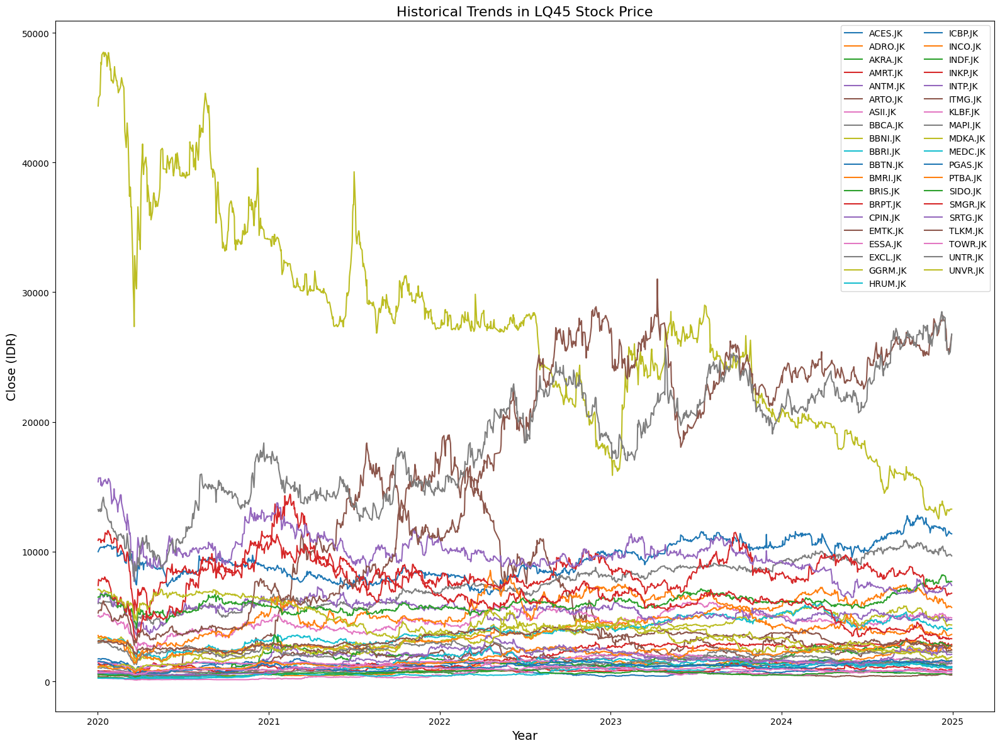

In [ ]:
import matplotlib.pyplot as plt

# Plot data harga close untuk setiap saham
plt.figure(figsize=(16, 12))

for saham in saham_list:
    try:
        # Plot harga close saham
        plt.plot(df_all[saham].index, df_all[saham]['Close'], label=saham)
    except KeyError:
        print(f"Data for {saham} is missing or incomplete.")

# Menambahkan detail pada grafik
plt.title("Historical Trends in LQ45 Stock Price", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Close (IDR)", fontsize=14)
plt.legend(loc='upper right', fontsize=10, ncol=2)
plt.grid(False)
plt.tight_layout()

# Menampilkan grafik
plt.show()


#**Statistika Deskriptif**

**Statistika deskriptif seluruh saham**

In [ ]:
import yfinance as yf
import pandas as pd

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
    "Healthcare": ['KLBF.JK', 'SIDO.JK'],
    "Basic Material": ['ANTM.JK', 'BRPT.JK', 'SMGR.JK', 'ESSA.JK', 'INCO.JK', 'INKP.JK', 'INTP.JK', 'MDKA.JK'],
    "Financials": ['ARTO.JK', 'BBCA.JK', 'BBRI.JK', 'BBTN.JK', 'BBNI.JK', 'BMRI.JK', 'BRIS.JK', 'SRTG.JK'],
    "Technology": ['EMTK.JK'],
    "Consumer Non-Cyclicals": ['CPIN.JK', 'INDF.JK', 'ICBP.JK', 'GGRM.JK', 'AMRT.JK', 'UNVR.JK'],
    "Industrial": ['UNTR.JK', 'ASII.JK'],
    "Consumer Cyclicals": ['MAPI.JK', 'ACES.JK'],
    "Infrastructure": ['EXCL.JK', 'TLKM.JK', 'TOWR.JK'],
    "Energy": ['ADRO.JK', 'AKRA.JK', 'PTBA.JK', 'PGAS.JK', 'ITMG.JK', 'MEDC.JK', 'HRUM.JK']
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# DataFrame untuk menyimpan hasil
df_sektor_combined = {}

# Mengambil data untuk setiap sektor
for sektor, saham_list in sektor_saham.items():
    sektor_data = pd.DataFrame()
    for saham in saham_list:
        try:
            print(f"Downloading data for {saham} in {sektor} sector...")
            data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
            data.rename(columns={'Close': saham}, inplace=True)
            sektor_data = pd.concat([sektor_data, data], axis=1)
        except Exception as e:
            print(f"Error downloading {saham} in {sektor} sector: {e}")

    # Menyimpan statistik deskriptif per sektor
    if not sektor_data.empty:
        df_sektor_combined[sektor] = sektor_data.describe()

# Menampilkan statistik deskriptif untuk setiap sektor
for sektor, stats in df_sektor_combined.items():
    print(f"\nStatistik Deskriptif untuk sektor {sektor}:")
    print(stats)



[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed



Statistik Deskriptif untuk sektor Healthcare:
Price       KLBF.JK      SIDO.JK
Ticker      KLBF.JK      SIDO.JK
count   1211.000000  1211.000000
mean    1560.029128   644.388268
std      249.161956   107.610653
min      784.913330   369.045502
25%     1391.267273   573.549713
50%     1519.000000   648.047485
75%     1705.200073   703.429749
max     2271.538818   901.843079

Statistik Deskriptif untuk sektor Basic Material:
Price       ANTM.JK      BRPT.JK       SMGR.JK      ESSA.JK      INCO.JK  \
Ticker      ANTM.JK      BRPT.JK       SMGR.JK      ESSA.JK      INCO.JK   
count   1211.000000  1211.000000   1211.000000  1211.000000  1211.000000   
mean    1573.394326   963.182079   6989.241843   567.912350  4936.706033   
std      534.171478   173.436582   1919.255201   314.747945  1374.056063   
min      300.008911   448.876740   3240.000000   111.033218  1408.021973   
25%     1374.697266   832.217804   5982.199219   286.992645  3950.000000   
50%     1679.160400   940.081787   6662.

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
<ipython-input-37-57b42905ef40>:65: MatplotlibDeprecationWarning: Passing label as a length 2 sequence when plotting a single dataset is deprecated in Matplotlib 3.9 and will error in 3.11.  To keep the current behavior, cast the sequence to string before passing.
  plt.plot(data.index, data[saham], label=saham, linewidth=2)  # Label langsung dari nama panjang saham


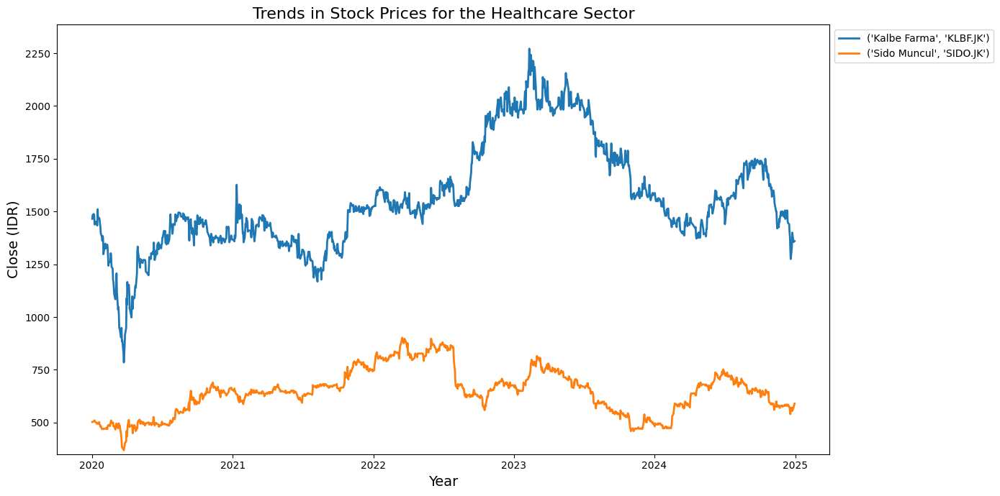

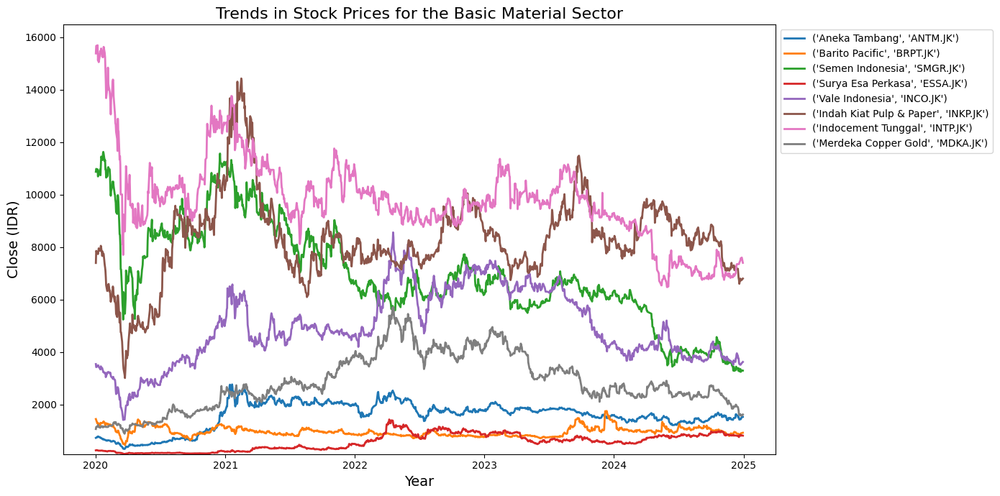

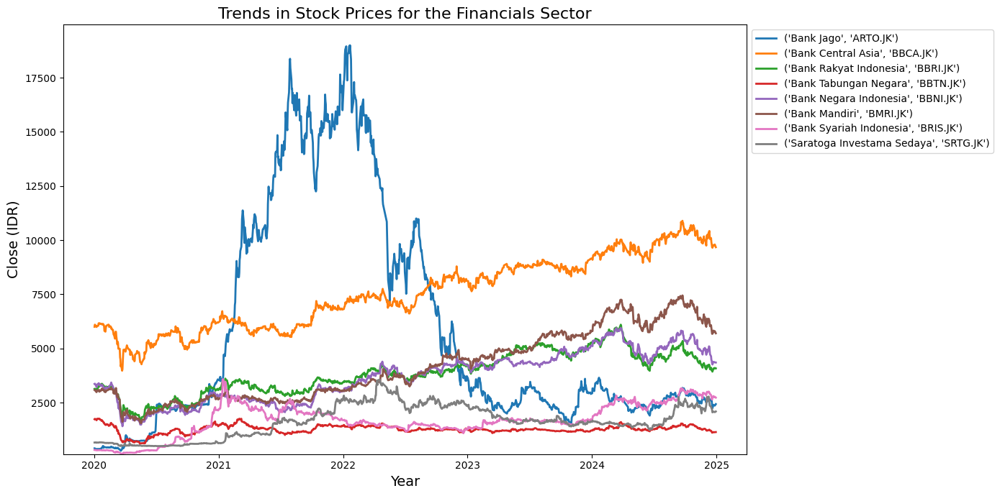

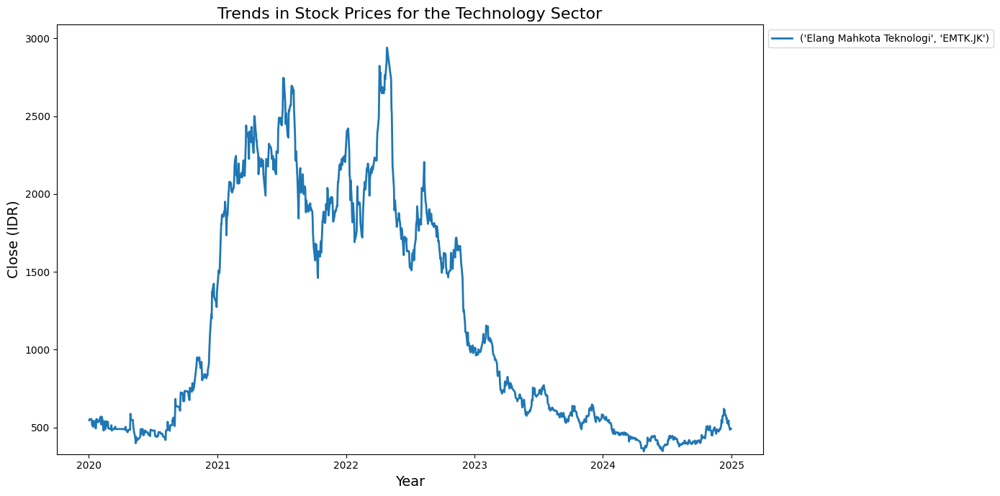

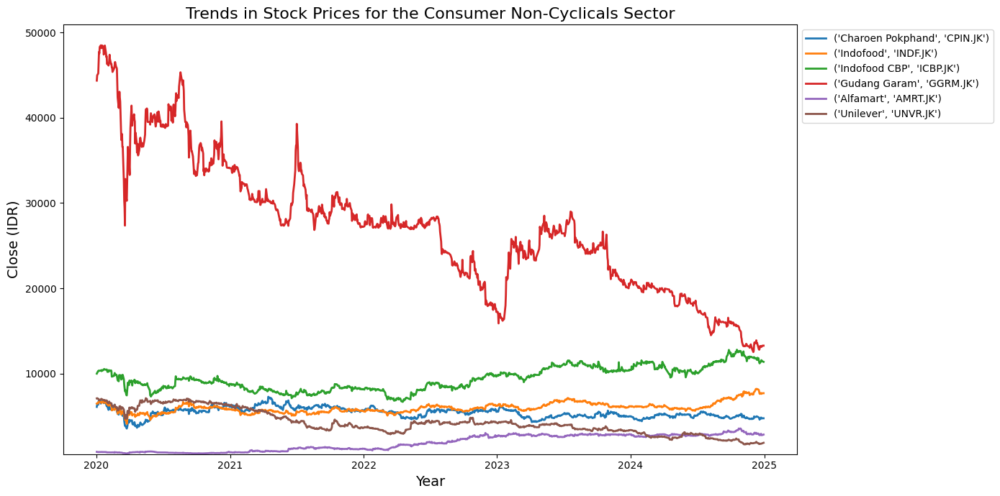

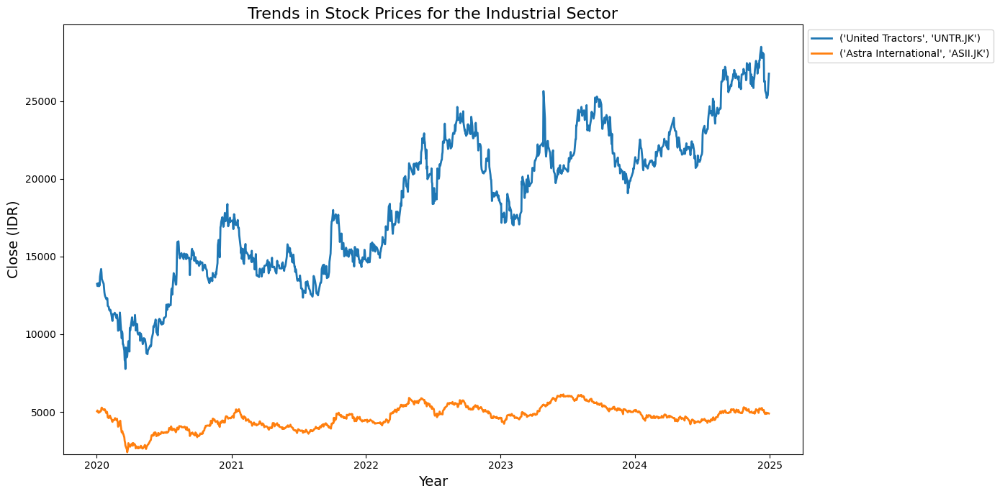

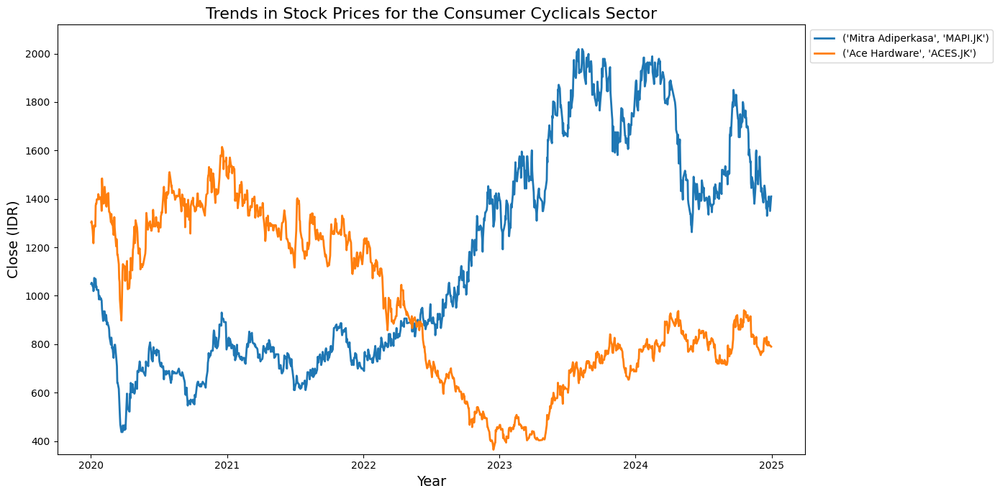

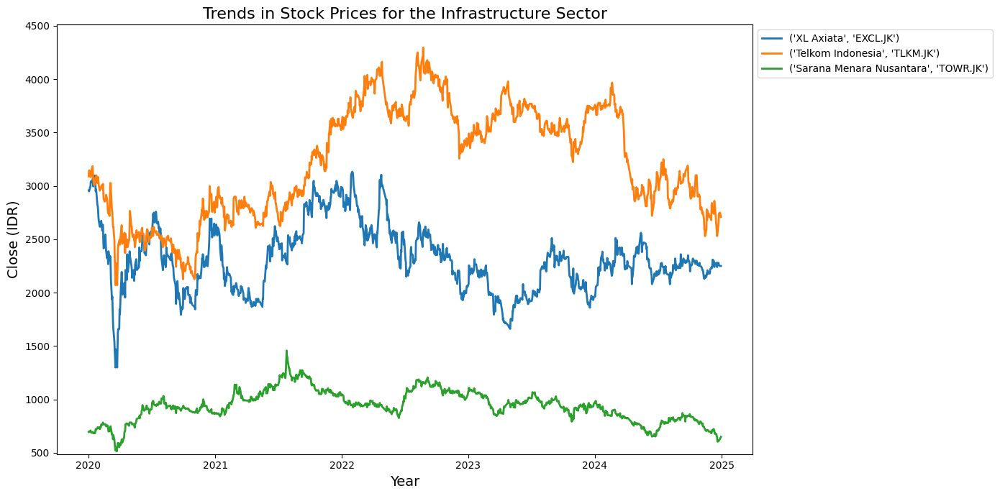

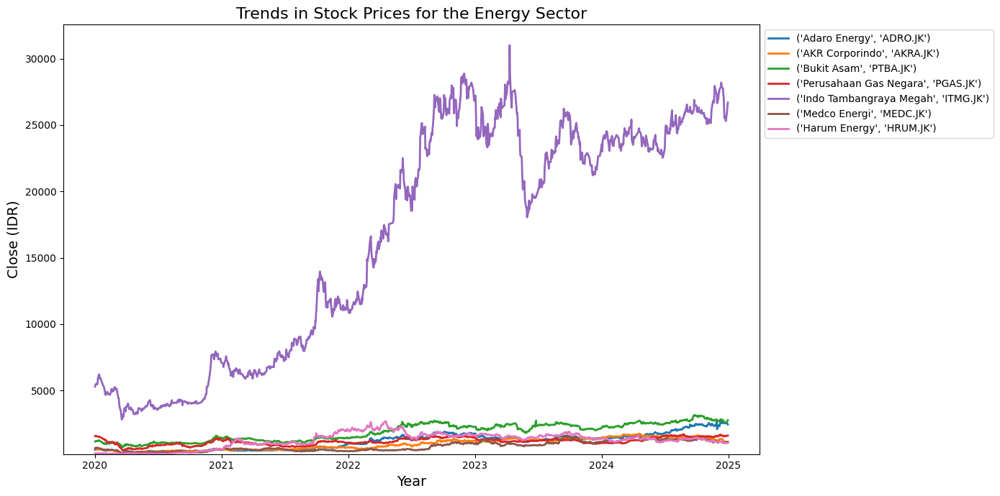

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
    "Healthcare": ['KLBF.JK', 'SIDO.JK'],
    "Basic Material": ['ANTM.JK', 'BRPT.JK', 'SMGR.JK', 'ESSA.JK', 'INCO.JK', 'INKP.JK', 'INTP.JK', 'MDKA.JK'],
    "Financials": ['ARTO.JK', 'BBCA.JK', 'BBRI.JK', 'BBTN.JK', 'BBNI.JK', 'BMRI.JK', 'BRIS.JK', 'SRTG.JK'],
    "Technology": ['EMTK.JK'],
    "Consumer Non-Cyclicals": ['CPIN.JK', 'INDF.JK', 'ICBP.JK', 'GGRM.JK', 'AMRT.JK', 'UNVR.JK'],
    "Industrial": ['UNTR.JK', 'ASII.JK'],
    "Consumer Cyclicals": ['MAPI.JK', 'ACES.JK'],
    "Infrastructure": ['EXCL.JK', 'TLKM.JK', 'TOWR.JK'],
    "Energy": ['ADRO.JK', 'AKRA.JK', 'PTBA.JK', 'PGAS.JK', 'ITMG.JK', 'MEDC.JK', 'HRUM.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'KLBF.JK': 'Kalbe Farma', 'SIDO.JK': 'Sido Muncul',
    'ANTM.JK': 'Aneka Tambang', 'BRPT.JK': 'Barito Pacific', 'SMGR.JK': 'Semen Indonesia',
    'ESSA.JK': 'Surya Esa Perkasa', 'INCO.JK': 'Vale Indonesia', 'INKP.JK': 'Indah Kiat Pulp & Paper',
    'INTP.JK': 'Indocement Tunggal', 'MDKA.JK': 'Merdeka Copper Gold',
    'ARTO.JK': 'Bank Jago', 'BBCA.JK': 'Bank Central Asia', 'BBRI.JK': 'Bank Rakyat Indonesia',
    'BBTN.JK': 'Bank Tabungan Negara', 'BBNI.JK': 'Bank Negara Indonesia',
    'BMRI.JK': 'Bank Mandiri', 'BRIS.JK': 'Bank Syariah Indonesia', 'SRTG.JK': 'Saratoga Investama Sedaya',
    'EMTK.JK': 'Elang Mahkota Teknologi',
    'CPIN.JK': 'Charoen Pokphand', 'INDF.JK': 'Indofood', 'ICBP.JK': 'Indofood CBP',
    'GGRM.JK': 'Gudang Garam', 'AMRT.JK': 'Alfamart', 'UNVR.JK': 'Unilever',
    'UNTR.JK': 'United Tractors', 'ASII.JK': 'Astra International',
    'MAPI.JK': 'Mitra Adiperkasa', 'ACES.JK': 'Ace Hardware',
    'EXCL.JK': 'XL Axiata', 'TLKM.JK': 'Telkom Indonesia', 'TOWR.JK': 'Sarana Menara Nusantara',
    'ADRO.JK': 'Adaro Energy', 'AKRA.JK': 'AKR Corporindo', 'PTBA.JK': 'Bukit Asam',
    'PGAS.JK': 'Perusahaan Gas Negara', 'ITMG.JK': 'Indo Tambangraya Megah',
    'MEDC.JK': 'Medco Energi', 'HRUM.JK': 'Harum Energy'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# DataFrame untuk menyimpan hasil
df_sektor_combined = {}

# Mengambil data untuk setiap sektor
for sektor, saham_list in sektor_saham.items():
    sektor_data = pd.DataFrame()
    for saham in saham_list:
        try:
            print(f"Downloading data for {saham} in {sektor} sector...")
            data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
            data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
            sektor_data = pd.concat([sektor_data, data], axis=1)
        except Exception as e:
            print(f"Error downloading {saham} in {sektor} sector: {e}")

    # Menyimpan data sektor yang berhasil diunduh
    if not sektor_data.empty:
        df_sektor_combined[sektor] = sektor_data

# Menampilkan grafik untuk setiap sektor
for sektor, data in df_sektor_combined.items():
    plt.figure(figsize=(14, 7))
    for saham in data.columns:
        plt.plot(data.index, data[saham], label=saham, linewidth=2)  # Label langsung dari nama panjang saham

    # Menyesuaikan batas y-axis agar lebih fokus pada data
    y_min = data.min().min() - (data.min().min() * 0.05)  # Kurangi 5% dari nilai minimum
    y_max = data.max().max() + (data.max().max() * 0.05)  # Tambah 5% dari nilai maksimum
    plt.ylim(y_min, y_max)

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

##Sector Healthcare

[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


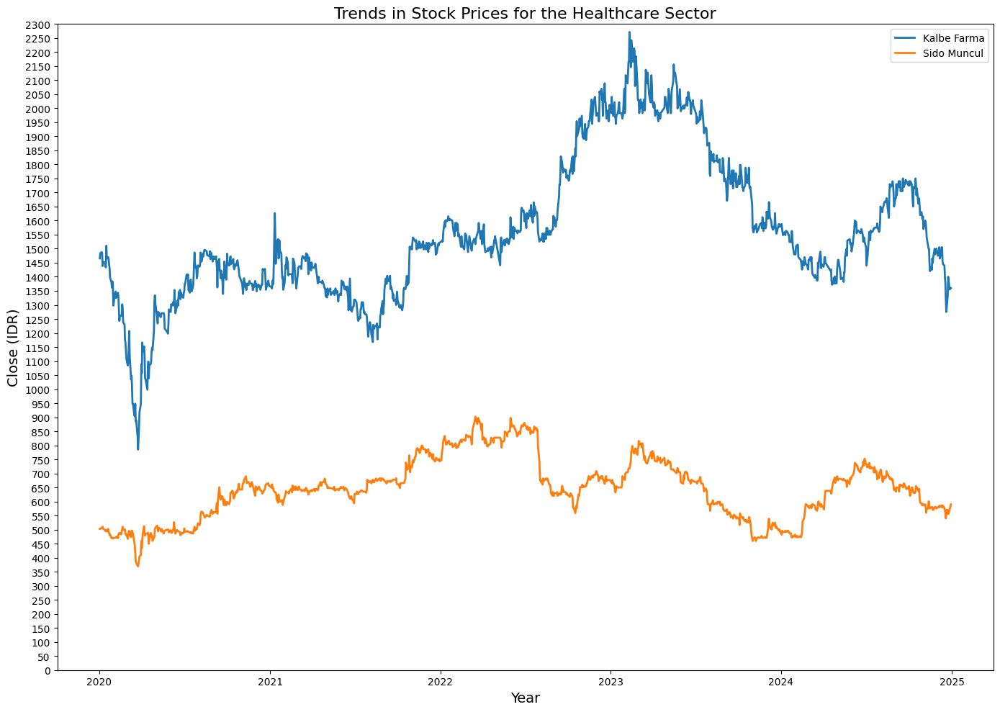

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
    "Healthcare": ['KLBF.JK', 'SIDO.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'KLBF.JK': 'Kalbe Farma', 'SIDO.JK': 'Sido Muncul'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Healthcare"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(14, 10))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 50  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)  # Legend hanya menampilkan nama perusahaan
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()


##Sector Financials

[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


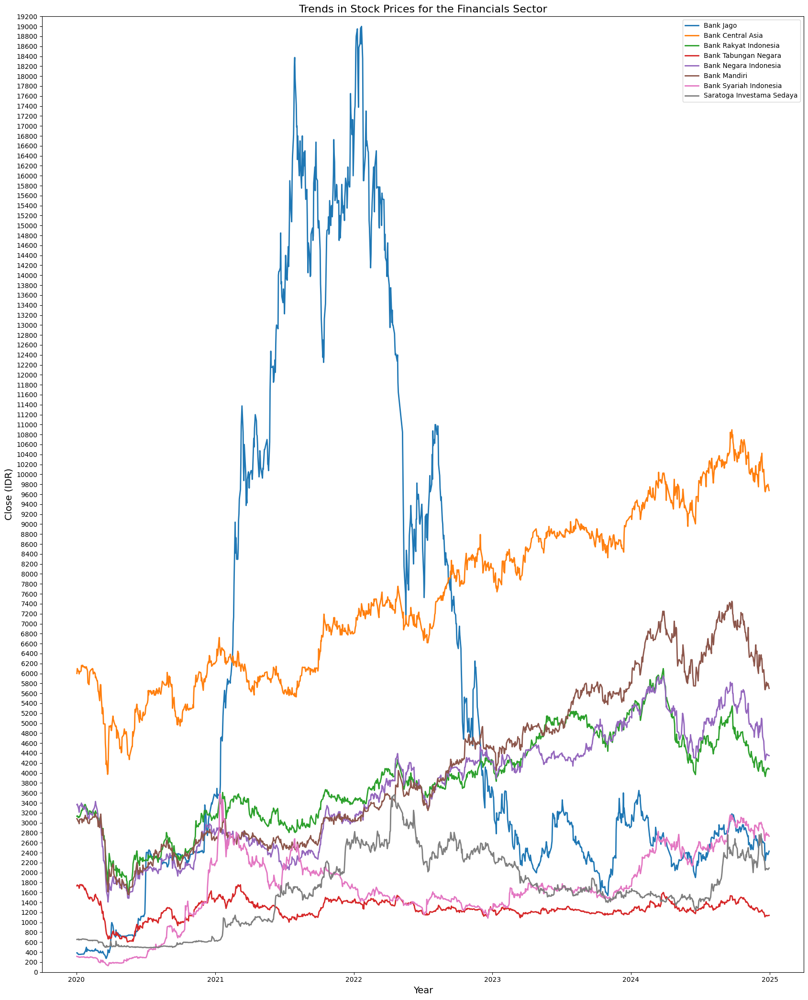

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
    "Financials": ['ARTO.JK', 'BBCA.JK', 'BBRI.JK', 'BBTN.JK', 'BBNI.JK', 'BMRI.JK', 'BRIS.JK', 'SRTG.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'ARTO.JK': 'Bank Jago', 'BBCA.JK': 'Bank Central Asia', 'BBRI.JK': 'Bank Rakyat Indonesia',
    'BBTN.JK': 'Bank Tabungan Negara', 'BBNI.JK': 'Bank Negara Indonesia',
    'BMRI.JK': 'Bank Mandiri', 'BRIS.JK': 'Bank Syariah Indonesia', 'SRTG.JK': 'Saratoga Investama Sedaya'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Financials"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(17, 21))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 200  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()


##Sector Basic Material

[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


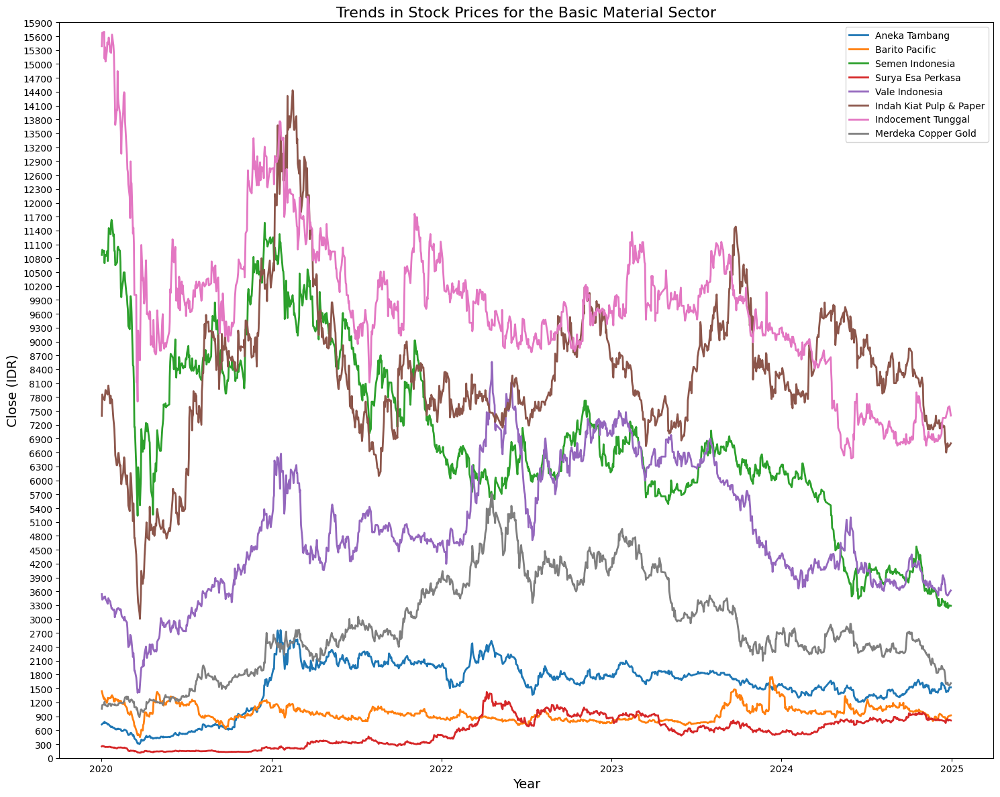

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
    "Basic Material": ['ANTM.JK', 'BRPT.JK', 'SMGR.JK', 'ESSA.JK', 'INCO.JK', 'INKP.JK', 'INTP.JK', 'MDKA.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'ANTM.JK': 'Aneka Tambang', 'BRPT.JK': 'Barito Pacific', 'SMGR.JK': 'Semen Indonesia',
    'ESSA.JK': 'Surya Esa Perkasa', 'INCO.JK': 'Vale Indonesia', 'INKP.JK': 'Indah Kiat Pulp & Paper',
    'INTP.JK': 'Indocement Tunggal', 'MDKA.JK': 'Merdeka Copper Gold'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Basic Material"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(15, 12))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 100 + 1) * 100  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 300  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()


##Sector Technology

[*********************100%***********************]  1 of 1 completed

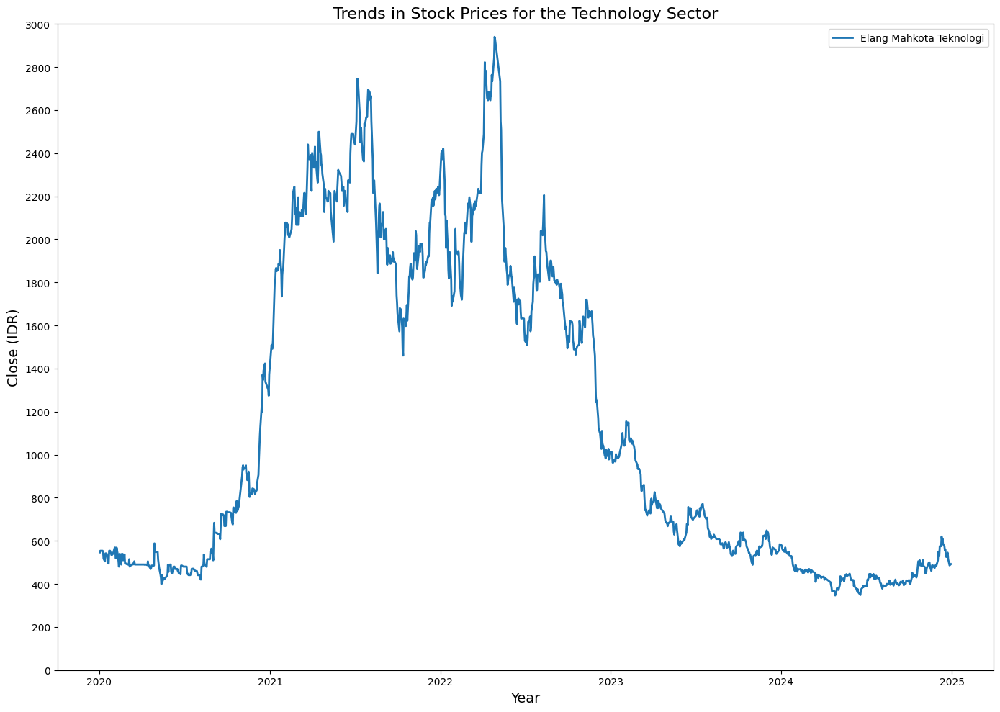

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Technology": ['EMTK.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'EMTK.JK': 'Elang Mahkota Teknologi'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Technology"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(14, 10))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 200  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

##Sector Consumer Cyclicals

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

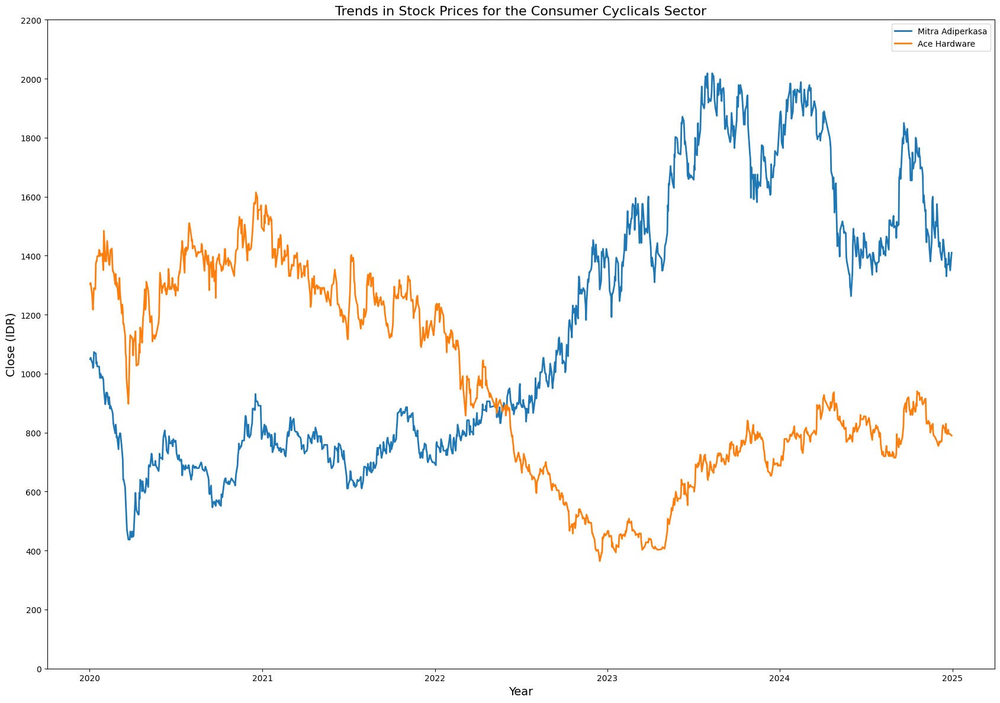

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Consumer Cyclicals": ['MAPI.JK', 'ACES.JK'],
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'MAPI.JK': 'Mitra Adiperkasa', 'ACES.JK': 'Ace Hardware'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Consumer Cyclicals"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(17, 12))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 200  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

##Sector Consumer Non-Cyclicals

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


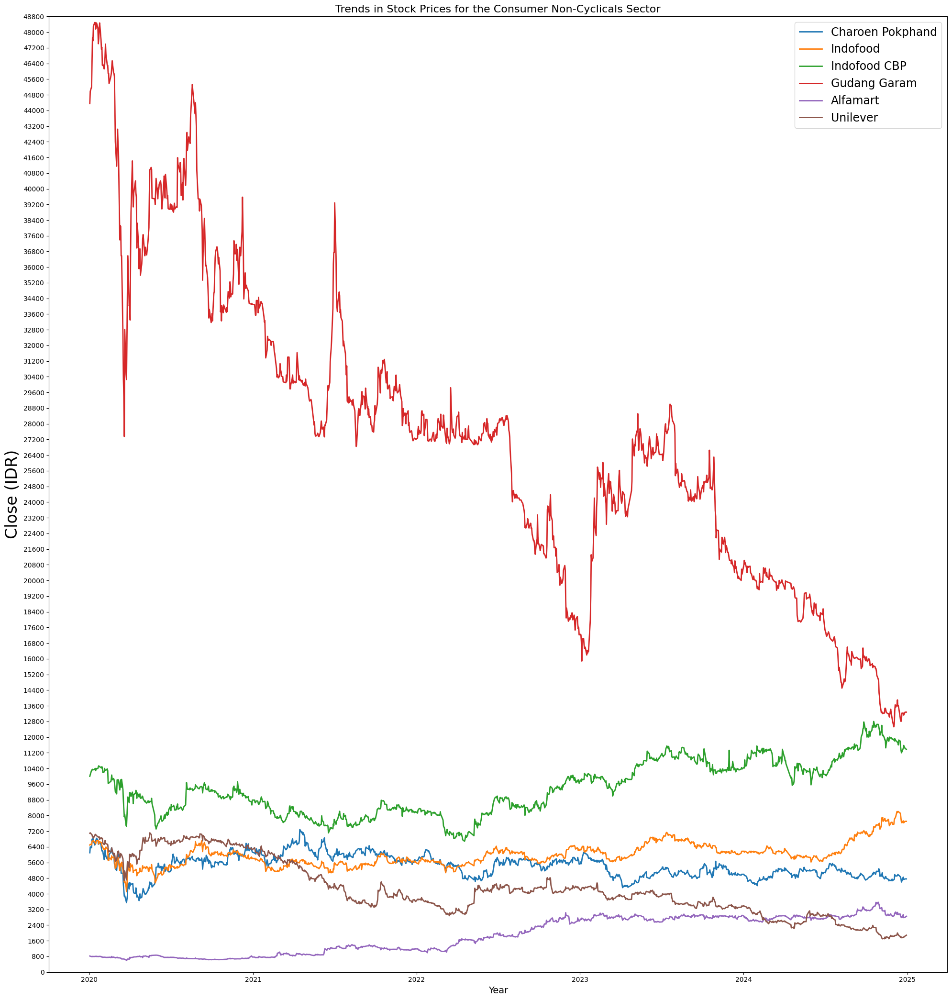

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Consumer Non-Cyclicals": ['CPIN.JK', 'INDF.JK', 'ICBP.JK', 'GGRM.JK', 'AMRT.JK', 'UNVR.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'CPIN.JK': 'Charoen Pokphand', 'INDF.JK': 'Indofood', 'ICBP.JK': 'Indofood CBP',
    'GGRM.JK': 'Gudang Garam', 'AMRT.JK': 'Alfamart', 'UNVR.JK': 'Unilever'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Consumer Non-Cyclicals"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(20, 21))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 400 + 1) * 400  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 800  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=24)
    plt.legend(loc='upper right', fontsize=17)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()


##Sector Industrial

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

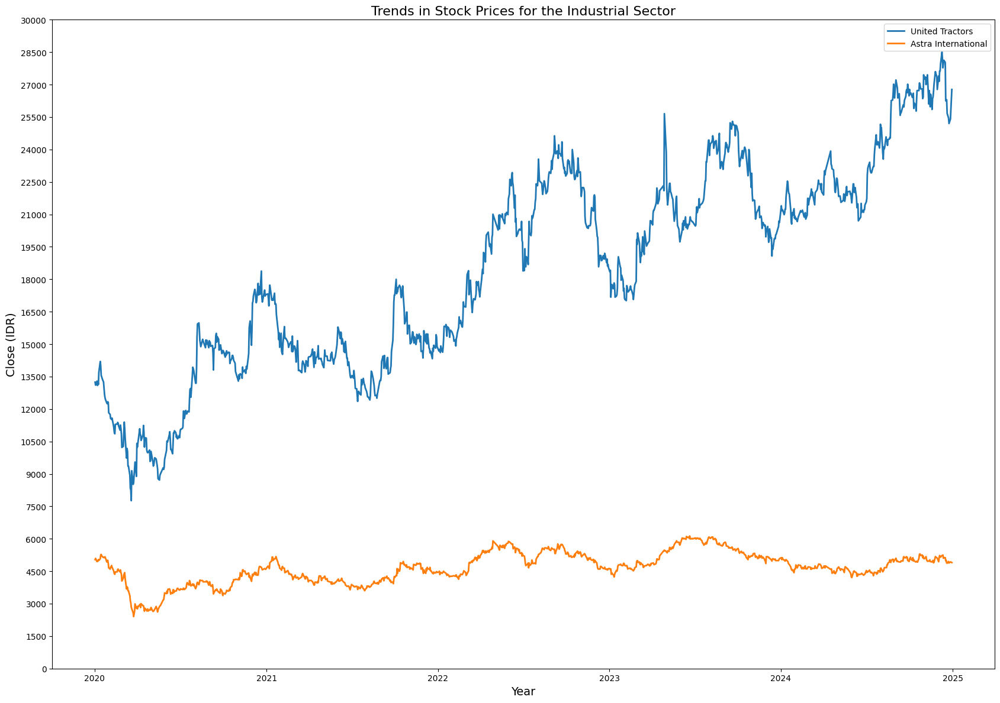

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Industrial": ['UNTR.JK', 'ASII.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'UNTR.JK': 'United Tractors', 'ASII.JK': 'Astra International'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Industrial"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(17, 12))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 1500  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

##Sector Energy

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


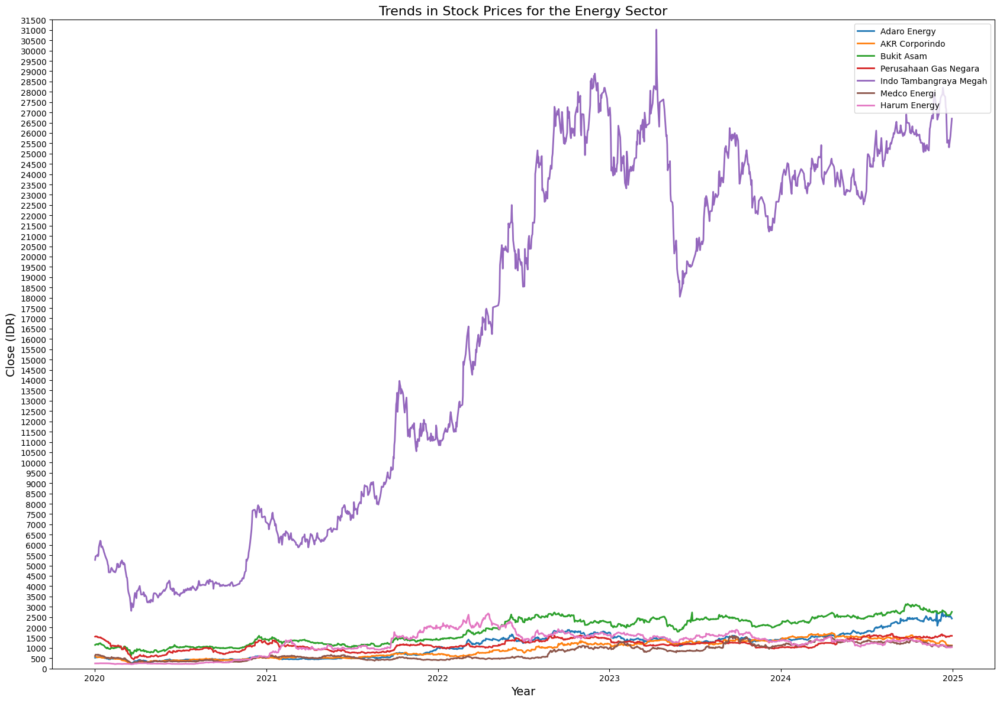

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Energy": ['ADRO.JK', 'AKRA.JK', 'PTBA.JK', 'PGAS.JK', 'ITMG.JK', 'MEDC.JK', 'HRUM.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'ADRO.JK': 'Adaro Energy', 'AKRA.JK': 'AKR Corporindo', 'PTBA.JK': 'Bukit Asam',
    'PGAS.JK': 'Perusahaan Gas Negara', 'ITMG.JK': 'Indo Tambangraya Megah',
    'MEDC.JK': 'Medco Energi', 'HRUM.JK': 'Harum Energy'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Energy"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(17, 12))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 500 + 1) * 500  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 500  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

##Sector Infrastructure

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


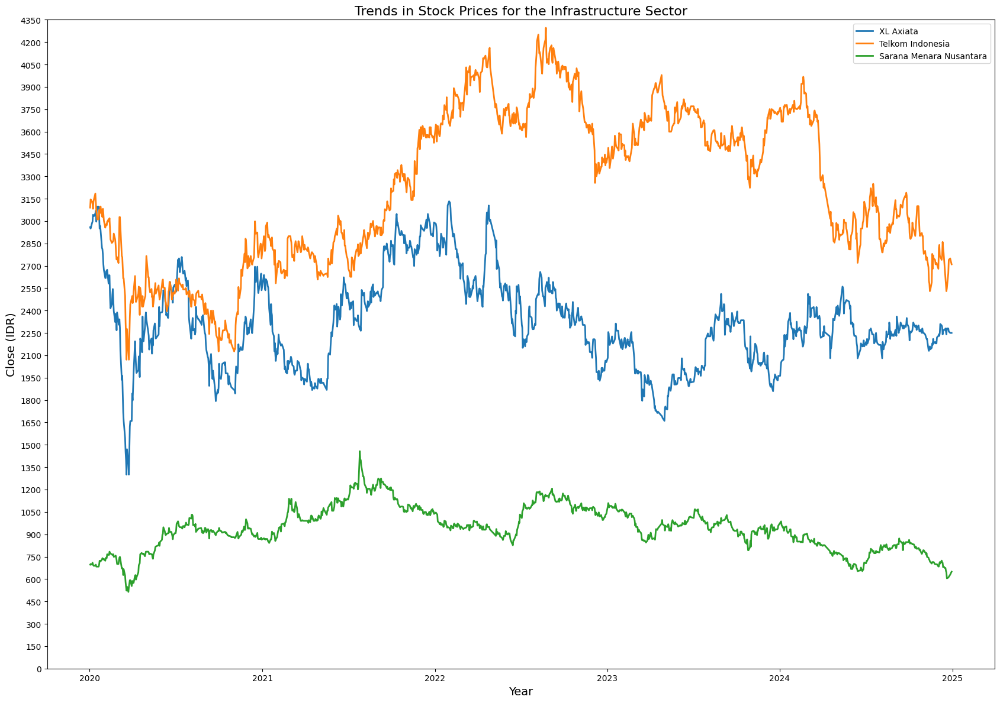

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan sektor dan saham-saham yang termasuk dalam sektor tersebut
sektor_saham = {
      "Infrastructure": ['EXCL.JK', 'TLKM.JK', 'TOWR.JK']
}

# Mapping kode saham ke nama panjang saham
saham_names = {
    'EXCL.JK': 'XL Axiata', 'TLKM.JK': 'Telkom Indonesia', 'TOWR.JK': 'Sarana Menara Nusantara'
}

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2024-12-31'

# Misalnya kita hanya akan mengunduh data untuk sektor "Healthcare"
sektor = "Infrastructure"
saham_list = sektor_saham[sektor]

# DataFrame untuk menyimpan hasil
sektor_data = pd.DataFrame()

# Mengambil data untuk sektor tersebut
for saham in saham_list:
    try:
        print(f"Downloading data for {saham} in {sektor} sector...")
        data = yf.download(saham, start=start_date, end=end_date, interval="1d")[['Close']]
        data.rename(columns={'Close': saham_names[saham]}, inplace=True)  # Ganti kolom dengan nama panjang saham
        sektor_data = pd.concat([sektor_data, data], axis=1)
    except Exception as e:
        print(f"Error downloading {saham} in {sektor} sector: {e}")

# Menampilkan grafik untuk sektor tersebut
if not sektor_data.empty:
    plt.figure(figsize=(17, 12))
    for saham, name in zip(sektor_data.columns, saham_list):
        # Gunakan label dari `saham_names` untuk memastikan hanya nama perusahaan
        plt.plot(sektor_data.index, sektor_data[saham], label=saham_names[name], linewidth=2)

    # Menyesuaikan batas y-axis agar tidak di bawah 500 dan menggunakan interval yang lebih jelas
    y_min = 0  # Mulai dari 0
    y_max = int(sektor_data.max().max() // 50 + 1) * 50  # Membulatkan ke atas ke kelipatan 50 terdekat
    plt.ylim(y_min, y_max)

    # Menyesuaikan interval ticks pada sumbu Y
    interval = 150  # Interval antar ticks
    plt.yticks(range(y_min, y_max + interval, interval))  # Menentukan jarak antar ticks pada sumbu Y

    # Menambahkan detail plot
    plt.title(f"Trends in Stock Prices for the {sektor} Sector", fontsize=16)
    plt.xlabel("Year", fontsize=14)
    plt.ylabel("Close (IDR)", fontsize=14)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(False)
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

#**Prediction Stock Using GRU**

##ACES

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.1094
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - loss: 0.0033
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 0.0011
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 9.4399e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 8.5851e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 8.5604e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 8.5170e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 7.7647e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 7.1202e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 7.9973e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 7.6969e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 6.8082e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - loss: 7.0030e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 6.6610e-04
Epoch 15/30
30/30 ━━━━━━━

<ipython-input-4-867f7e18455c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


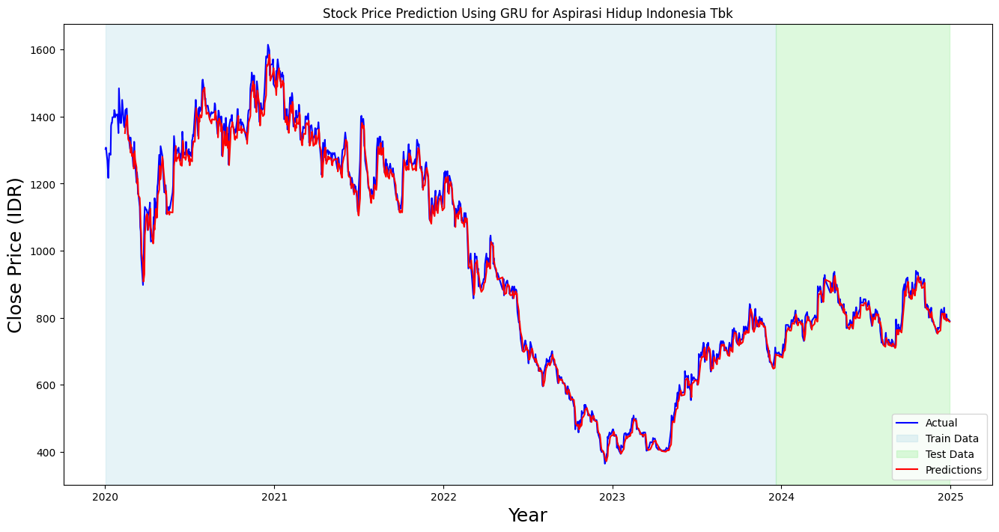

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ACES.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Aspirasi Hidup Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
# Menampilkan prediksi training
print("Prediksi Data Training:")
print(prediction_train)

# Menampilkan prediksi testing
print("Prediksi Data Testing:")
print(predictions)

Prediksi Data Training:
[[1350.4218 ]
 [1367.4489 ]
 [1395.3943 ]
 [1403.1792 ]
 [1360.8275 ]
 [1333.1644 ]
 [1328.9502 ]
 [1324.8611 ]
 [1292.4502 ]
 [1315.5544 ]
 [1301.757  ]
 [1281.931  ]
 [1289.147  ]
 [1244.8812 ]
 [1247.6832 ]
 [1297.1792 ]
 [1270.9467 ]
 [1248.9573 ]
 [1200.0492 ]
 [1215.059  ]
 [1204.403  ]
 [1164.9668 ]
 [1157.2207 ]
 [1125.5509 ]
 [1072.6556 ]
 [1051.2366 ]
 [ 991.9684 ]
 [ 961.6999 ]
 [ 907.8907 ]
 [ 929.53046]
 [1046.2445 ]
 [1101.9839 ]
 [1108.2634 ]
 [1109.1321 ]
 [1102.4303 ]
 [1061.4556 ]
 [1084.4414 ]
 [1106.6649 ]
 [1125.0801 ]
 [1069.8307 ]
 [1028.0391 ]
 [1021.3286 ]
 [1035.9806 ]
 [1075.4523 ]
 [1062.5183 ]
 [1124.5671 ]
 [1119.4667 ]
 [1098.1239 ]
 [1126.2131 ]
 [1166.1224 ]
 [1181.5276 ]
 [1252.9503 ]
 [1211.7535 ]
 [1214.0382 ]
 [1280.092  ]
 [1268.04   ]
 [1248.3933 ]
 [1213.6447 ]
 [1169.6519 ]
 [1178.1866 ]
 [1156.4854 ]
 [1108.671  ]
 [1111.8413 ]
 [1116.1271 ]
 [1107.2506 ]
 [1115.1979 ]
 [1113.7195 ]
 [1149.9513 ]
 [1174.8342 ]
 [1251.670

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_aces = pd.DataFrame(all_predictions, columns=["All Predictions Aces"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_aces)

# Jika ingin menyimpan ke file CSV
df_predictions_aces.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Aces
0              1350.421753
1              1367.448853
2              1395.394287
3              1403.179199
4              1360.827515
...                    ...
1176            798.926880
1177            790.507446
1178            797.681519
1179            790.522949
1180            787.855591

[1181 rows x 1 columns]


In [ ]:
# Jumlah total data
print(f"Jumlah total data: {len(data)}")

# Jumlah data training
print(f"Jumlah data training: {len(train)}")

# Jumlah data testing
print(f"Jumlah data testing: {len(valid)}")

# Jumlah data prediksi training
print(f"Jumlah data prediksi training: {len(prediction_train)}")

# Jumlah data prediksi testing
print(f"Jumlah data prediksi testing: {len(predictions)}")

# Jumlah data prediksi
print(f"Jumlah data prediksi: {len(df_predictions_aces)}")

Jumlah total data: 1211
Jumlah data training: 969
Jumlah data testing: 242
Jumlah data prediksi training: 939
Jumlah data prediksi testing: 242
Jumlah data prediksi: 1181


##ADRO

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.0366
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.7519e-04
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 2.9786e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 2.3513e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.5085e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.6221e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.0468e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.6439e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.0597e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 2.7414e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 2.0669e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 1.8422e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 1.9790e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 1.8046e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━

<ipython-input-8-f0918d32e401>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


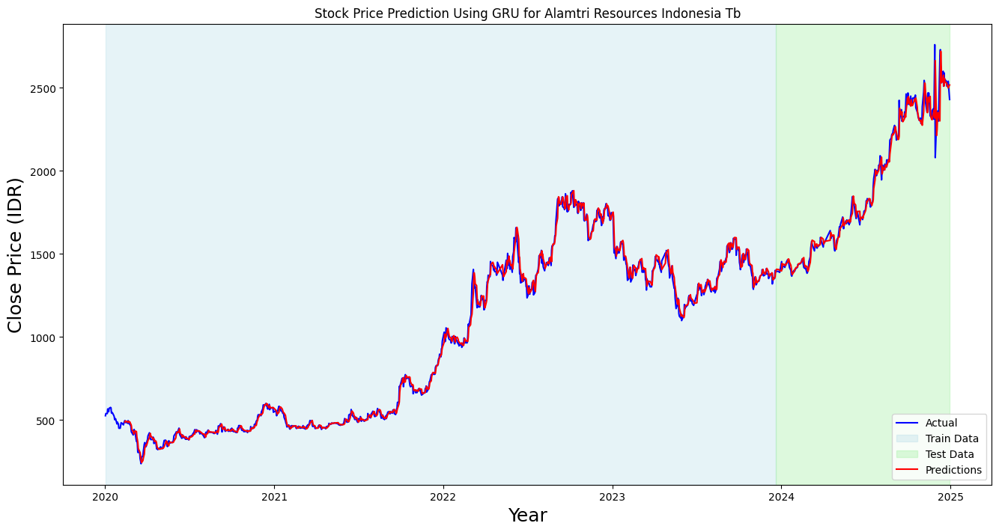

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ADRO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Alamtri Resources Indonesia Tb')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_adro = pd.DataFrame(all_predictions, columns=["All Predictions Adro"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_adro)

# Jika ingin menyimpan ke file CSV
df_predictions_adro.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Adro
0               487.577271
1               494.795776
2               491.719482
3               489.118073
4               490.075745
...                    ...
1176           2532.664062
1177           2532.216309
1178           2525.354736
1179           2499.566162
1180           2517.736084

[1181 rows x 1 columns]


##AKRA

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.0503
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0010
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - loss: 4.3261e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 3.5482e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 3.5139e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 3.6062e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 3.5290e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 2.8069e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 3.5604e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - loss: 3.2279e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 3.6232e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - loss: 3.4326e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 4.2106e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 2.8595e-04
Epoch 15/30
30/30 ━━━━━

<ipython-input-31-efda3abbbe4a>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


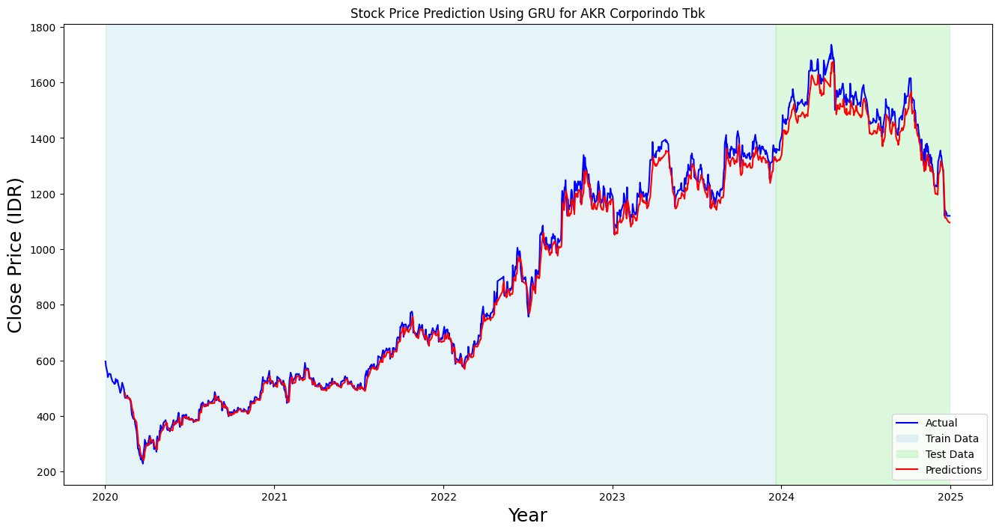

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'AKRA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for AKR Corporindo Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_akra = pd.DataFrame(all_predictions, columns=["All Predictions Akra"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_akra)

# Jika ingin menyimpan ke file CSV
df_predictions_akra.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Akra
0               473.971649
1               461.701508
2               455.205750
3               454.877167
4               457.486053
...                    ...
1176           1116.671265
1177           1115.499023
1178           1109.247681
1179           1100.279663
1180           1097.496094

[1181 rows x 1 columns]


##AMRT

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0578
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0014
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.1856e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.6169e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.9276e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.6173e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 3.2403e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 3.1995e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.0771e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.4359e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.9610e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.8631e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.0471e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.1672e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-12-21c8fee09fd6>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


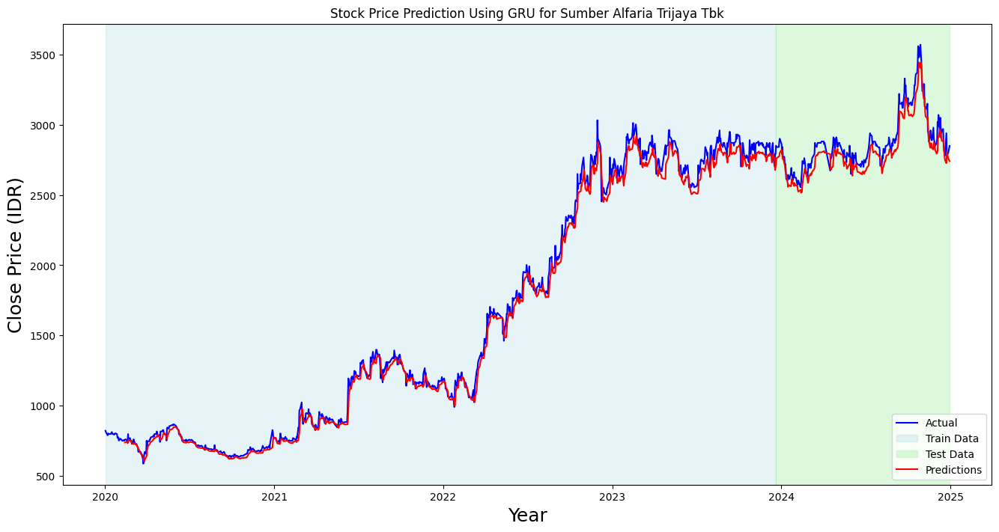

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'AMRT.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Sumber Alfaria Trijaya Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_amrt = pd.DataFrame(all_predictions, columns=["All Predictions Amrt"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_amrt)

# Jika ingin menyimpan ke file CSV
df_predictions_amrt.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Amrt
0               737.628845
1               738.797791
2               741.806458
3               741.801758
4               733.301147
...                    ...
1176           2748.896973
1177           2726.280029
1178           2813.224365
1179           2759.833984
1180           2741.130371

[1181 rows x 1 columns]


##ANTM

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0786
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0025
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 0.0011
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.8808e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.5612e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.9487e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 9.2628e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.5369e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 7.0732e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 8.0257e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 7.3687e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.5126e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 6.4693e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.2045e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━

<ipython-input-14-5f7f2a480ae3>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


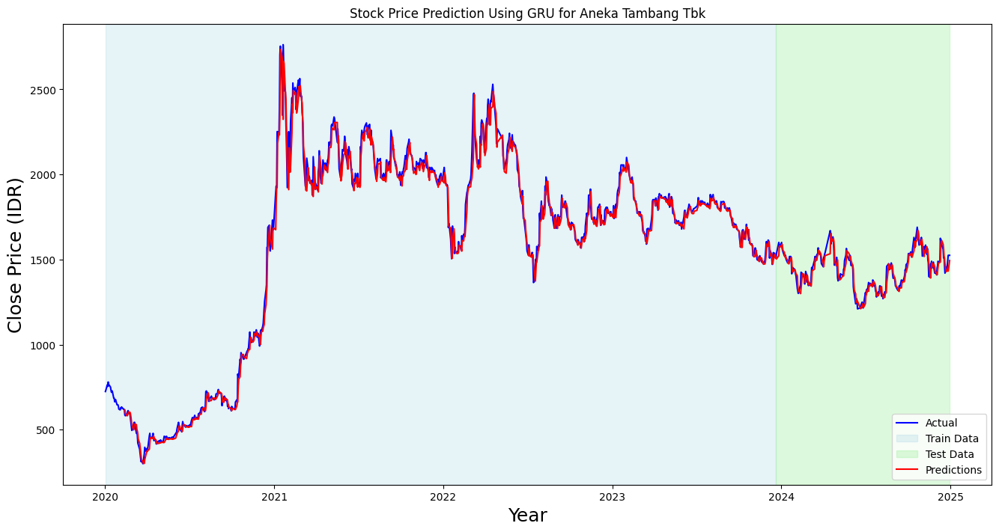

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ANTM.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Aneka Tambang Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_antm = pd.DataFrame(all_predictions, columns=["All Predictions Antm"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_antm)

# Jika ingin menyimpan ke file CSV
df_predictions_antm.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Antm
0               615.165405
1               597.289246
2               584.805237
3               581.625000
4               585.807800
...                    ...
1176           1474.675659
1177           1428.523071
1178           1439.035400
1179           1432.187744
1180           1494.032959

[1181 rows x 1 columns]


##ARTO

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - loss: 0.0642
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0020
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 6.9425e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 5.9788e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 6.6252e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.4498e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.4234e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.1902e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.0960e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.1813e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 4.4693e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 5.2570e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 3.8528e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.6794e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-19-a6ac9cd8d0eb>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


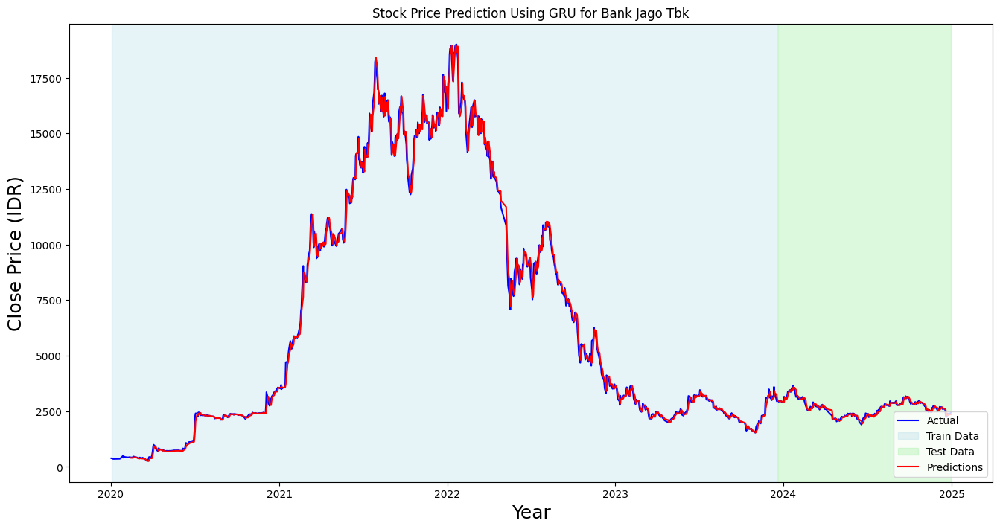

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ARTO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Jago Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_arto = pd.DataFrame(all_predictions, columns=["All Predictions Arto"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_arto)
# Jika ingin menyimpan ke file CSV
df_predictions_arto.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Arto
0               405.784149
1               405.729675
2               403.523438
3               402.288513
4               413.556030
...                    ...
1176           2438.685547
1177           2299.904541
1178           2339.886475
1179           2367.826904
1180           2361.210938

[1181 rows x 1 columns]


##ASII

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - loss: 0.1014
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 104ms/step - loss: 0.0033
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.0014
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.0010
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0011
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 9.9624e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 83ms/step - loss: 8.9310e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - loss: 8.1887e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 8.4172e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 8.4399e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 7.6202e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 7.5755e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 7.8002e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - loss: 8.1859e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━

<ipython-input-22-bd39d22edc1c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


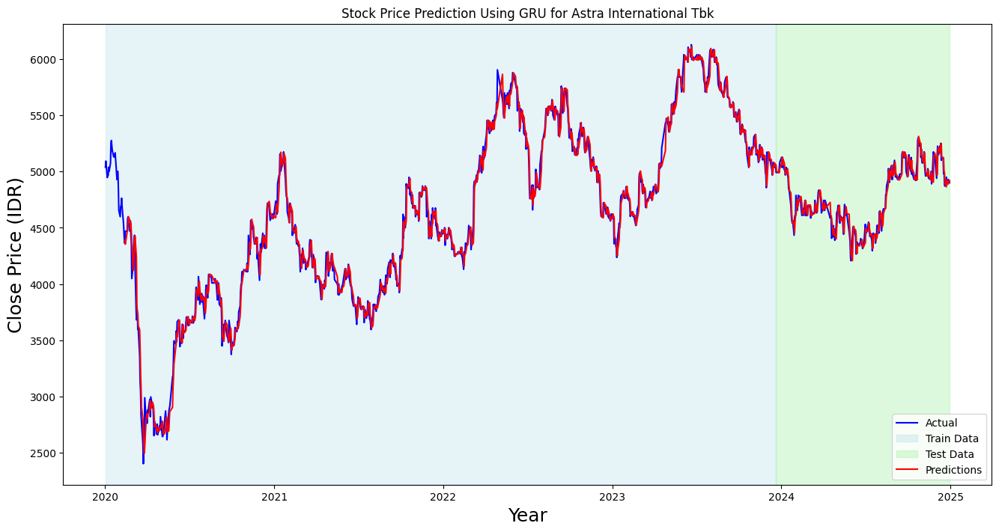

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ASII.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Astra International Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_asii = pd.DataFrame(all_predictions, columns=["All Predictions Asii"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_asii)

# Jika ingin menyimpan ke file CSV
df_predictions_asii.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Asii
0              4390.361816
1              4354.291992
2              4433.900879
3              4464.159668
4              4471.353516
...                    ...
1176           4894.149414
1177           4863.563965
1178           4926.308594
1179           4889.741211
1180           4919.250977

[1181 rows x 1 columns]


##BBCA

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - loss: 0.0540
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0016
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 4.4867e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 4.5934e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 3.7604e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.2604e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.6749e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.9419e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.6764e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.0997e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 4.0248e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 3.5372e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 3.4278e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.4100e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-24-955a56c31d55>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


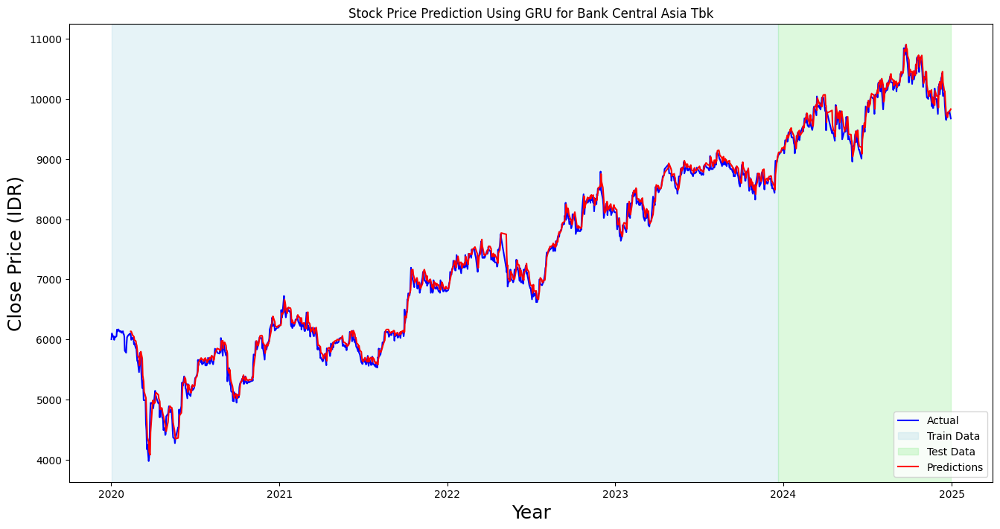

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BBCA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Central Asia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bbca = pd.DataFrame(all_predictions, columns=["All Predictions Bbca"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bbca)

# Jika ingin menyimpan ke file CSV
df_predictions_bbca.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bbca
0              6132.430176
1              6131.311035
2              6068.363770
3              6061.363281
4              6048.497559
...                    ...
1176           9745.051758
1177           9694.706055
1178           9779.028320
1179           9791.534180
1180           9830.776367

[1181 rows x 1 columns]


##BBNI

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0542
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0013
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.5548e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.1370e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.1916e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.9225e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 3.5747e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 3.8209e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 3.1679e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.7466e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.6608e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.0733e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.3820e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 2.8502e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-26-d822d96dc491>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


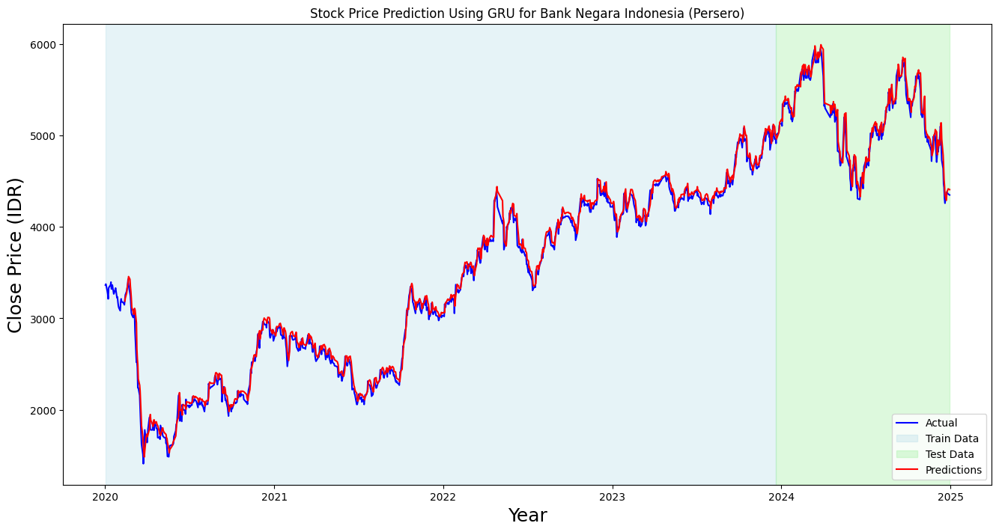

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BBNI.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Negara Indonesia (Persero)')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bbni = pd.DataFrame(all_predictions, columns=["All Predictions Bbni"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bbni)

# Jika ingin menyimpan ke file CSV
df_predictions_bbni.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bbni
0              3188.149170
1              3223.035400
2              3277.756348
3              3328.608643
4              3367.442383
...                    ...
1176           4352.569824
1177           4291.362305
1178           4379.772461
1179           4417.157227
1180           4408.860840

[1181 rows x 1 columns]


##BBRI

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0429
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0013
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 5.4140e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.8682e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.5449e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.8115e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 3.4153e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 3.1325e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 3.3898e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.2550e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.4301e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 3.3017e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.1894e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 3.4077e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-29-359289f75bc9>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


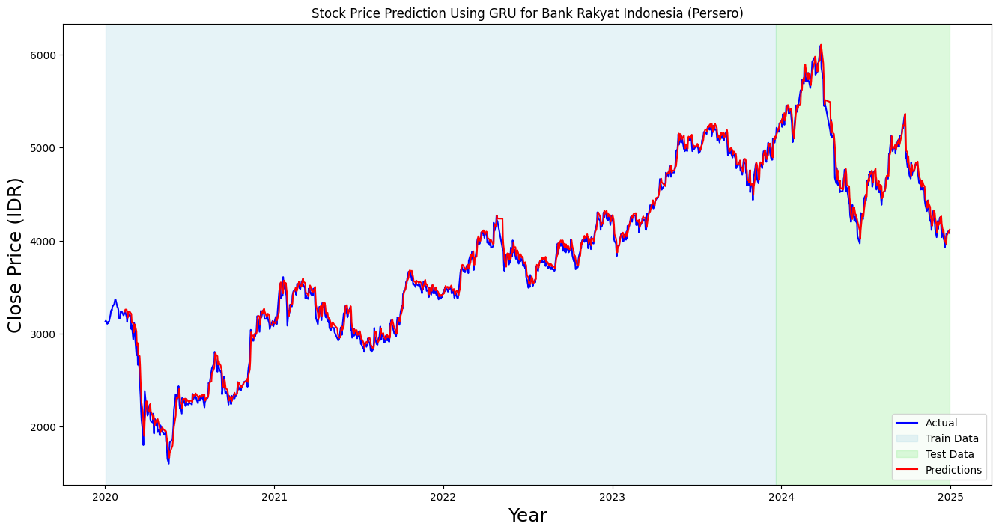

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BBRI.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Rakyat Indonesia (Persero)')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bbri = pd.DataFrame(all_predictions, columns=["All Predictions Bbri"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bbri)

# Jika ingin menyimpan ke file CSV
df_predictions_bbri.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bbri
0              3236.695068
1              3259.476074
2              3259.060059
3              3220.051514
4              3171.212646
...                    ...
1176           3997.531738
1177           3962.590820
1178           4056.810547
1179           4084.940674
1180           4116.143555

[1181 rows x 1 columns]


##BBTN

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.0852
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.0037
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0018
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0013
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0014
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0012
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0011
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0011
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0011
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.8198e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 9.3744e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 9.0385e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.8837e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.1653e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.

<ipython-input-31-546778642744>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


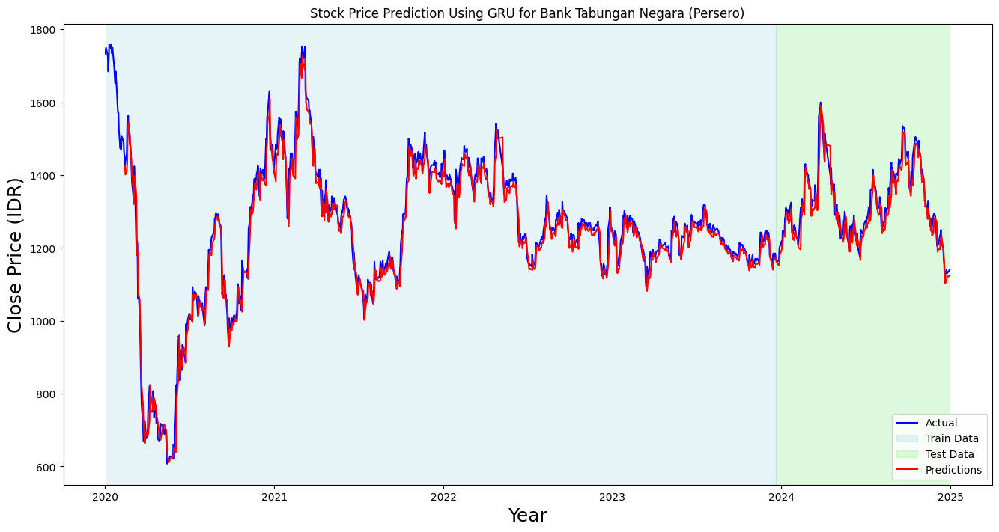

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BBTN.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Tabungan Negara (Persero)')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bbtn = pd.DataFrame(all_predictions, columns=["All Predictions Bbtn"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bbtn)

# Jika ingin menyimpan ke file CSV
df_predictions_bbtn.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bbtn
0              1425.141479
1              1401.511963
2              1410.314331
3              1436.645874
4              1516.947876
...                    ...
1176           1104.175415
1177           1106.650269
1178           1123.078369
1179           1121.362061
1180           1124.355225

[1181 rows x 1 columns]


##BMRI

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0365
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.9099e-04
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.7722e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 2.2656e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 2.3613e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 2.7108e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.2946e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.4144e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.2309e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 1.9669e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 1.9897e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.0700e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 2.2692e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 1.8623e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━

<ipython-input-33-369dcabfe5ed>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


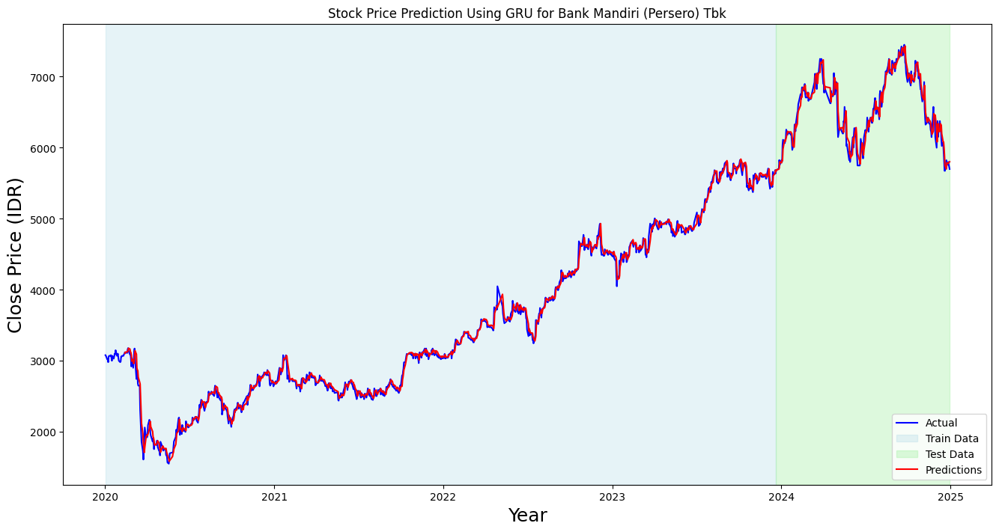

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BMRI.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Mandiri (Persero) Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bmri = pd.DataFrame(all_predictions, columns=["All Predictions Bmri"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bmri)

# Jika ingin menyimpan ke file CSV
df_predictions_bmri.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bmri
0              3107.406738
1              3123.739258
2              3125.717773
3              3130.843262
4              3127.728027
...                    ...
1176           5748.717773
1177           5700.162109
1178           5788.918457
1179           5778.827637
1180           5802.941406

[1181 rows x 1 columns]


##BRIS

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.0519
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0016
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.2410e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.5324e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.7050e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.6816e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.9505e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.3038e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 5.1259e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 6.0829e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.9370e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.7385e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.0182e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.2610e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-38-15bb8662a7b8>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


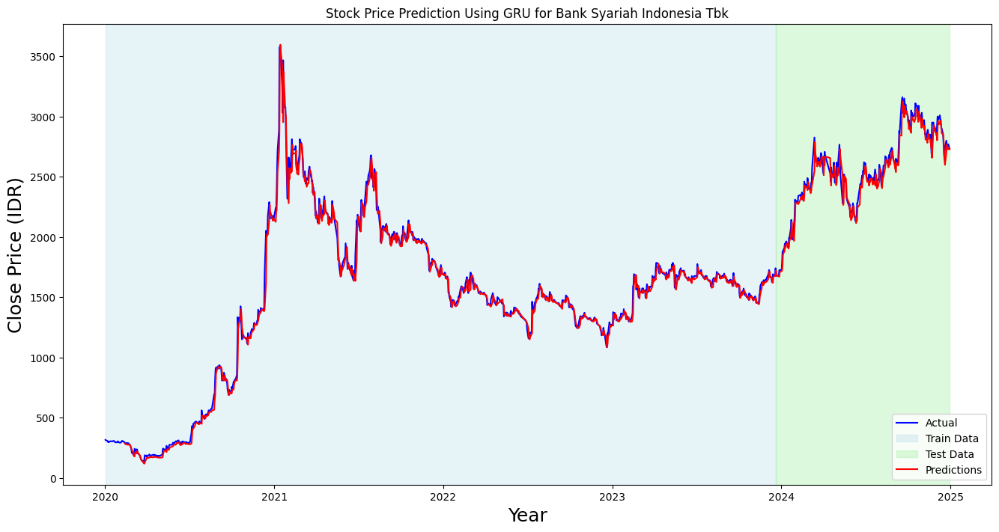

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BRIS.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bank Syariah Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_bris = pd.DataFrame(all_predictions, columns=["All Predictions Bris"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_bris)

# Jika ingin menyimpan ke file CSV
df_predictions_bris.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Bris
0               285.553345
1               280.660675
2               276.124817
3               275.458252
4               275.635071
...                    ...
1176           2598.404297
1177           2700.302979
1178           2767.991455
1179           2726.830078
1180           2733.743652

[1181 rows x 1 columns]


##BRPT

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0459
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.0032
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0017
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0015
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0016
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0014
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0011
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0012
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0011
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 9.9031e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 9.8411e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.7401e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0012
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 9.7831e-04

<ipython-input-46-46716223aad6>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


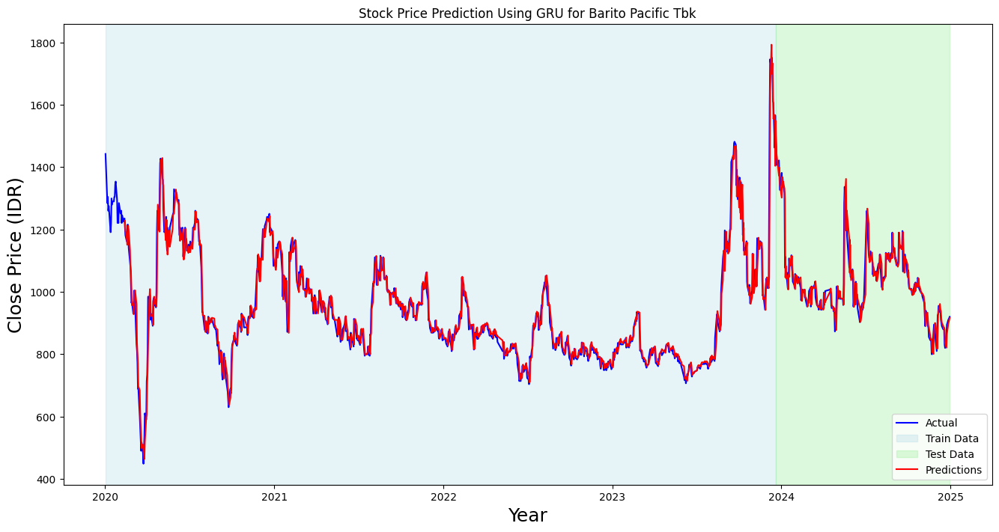

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'BRPT.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Barito Pacific Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_brpt = pd.DataFrame(all_predictions, columns=["All Predictions Brpt"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_brpt)

# Jika ingin menyimpan ke file CSV
df_predictions_brpt.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Brpt
0              1227.739746
1              1196.818115
2              1170.498413
3              1150.778442
4              1193.236694
...                    ...
1176            836.451294
1177            820.836914
1178            864.791443
1179            897.603027
1180            916.048706

[1181 rows x 1 columns]


##CPIN

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - loss: 0.0824
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0038
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.0025
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0024
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.0019
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0017
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - loss: 0.0020
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.0016
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.0016
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.0014
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.0015
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.0017
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.0014
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - loss: 0.0015
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0013
Epo

<ipython-input-48-11d7f083420e>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


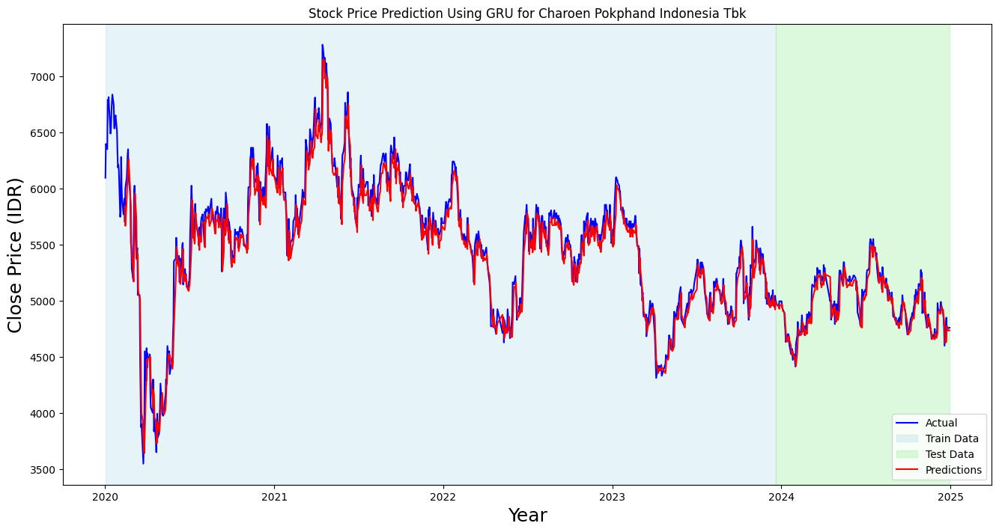

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'CPIN.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Charoen Pokphand Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_cpin = pd.DataFrame(all_predictions, columns=["All Predictions Cpin"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_cpin)

# Jika ingin menyimpan ke file CSV
df_predictions_cpin.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Cpin
0              5837.058105
1              5666.718750
2              5896.829102
3              6017.072754
4              6104.974121
...                    ...
1176           4624.679199
1177           4633.367676
1178           4778.464355
1179           4735.558594
1180           4736.719238

[1181 rows x 1 columns]


##EMTK

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.0853
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0018
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.1364e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.9454e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.4492e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.7298e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 6.8679e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.4590e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.4478e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 6.2766e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 5.9612e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.9341e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.0466e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.0622e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-50-2543d1466988>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


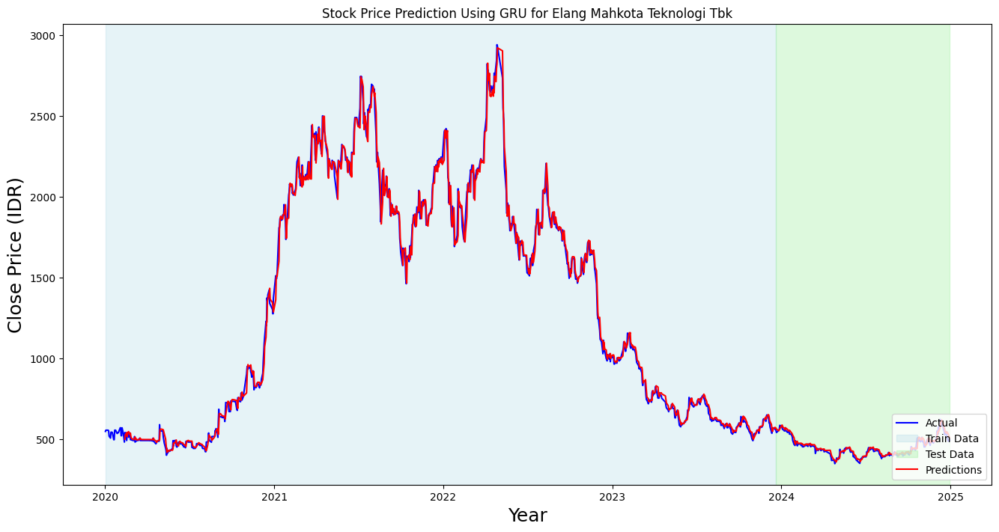

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'EMTK.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Elang Mahkota Teknologi Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_emtk = pd.DataFrame(all_predictions, columns=["All Predictions Emtk"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_emtk)

# Jika ingin menyimpan ke file CSV
df_predictions_emtk.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Emtk
0               498.275757
1               524.862122
2               539.304199
3               513.764038
4               531.571838
...                    ...
1176            546.602661
1177            535.104187
1178            543.883362
1179            530.005432
1180            505.158020

[1181 rows x 1 columns]


##ESSA

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0432
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0014
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 8.5181e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 7.8861e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.6411e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.3033e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.6433e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.5898e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 6.6186e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.6055e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 9.2268e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 6.9172e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 5.1453e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.3485e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-53-da99663f66e0>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


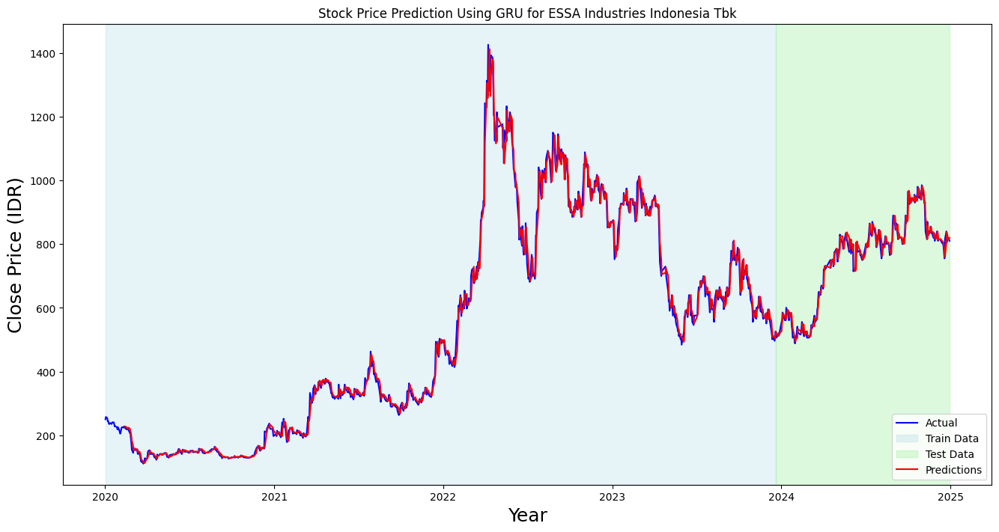

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ESSA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for ESSA Industries Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_essa = pd.DataFrame(all_predictions, columns=["All Predictions Essa"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_essa)

# Jika ingin menyimpan ke file CSV
df_predictions_essa.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Essa
0               228.124496
1               227.839859
2               225.406372
3               221.934296
4               221.571793
...                    ...
1176            758.457214
1177            804.914551
1178            837.920837
1179            813.928955
1180            819.331848

[1181 rows x 1 columns]


##EXCL

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0884
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0043
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0024
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0020
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0019
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0018
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0016
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0014
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0012
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0013
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0013
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0013
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0013
Epoch 16/30
30/

<ipython-input-55-621afcfd4fb5>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


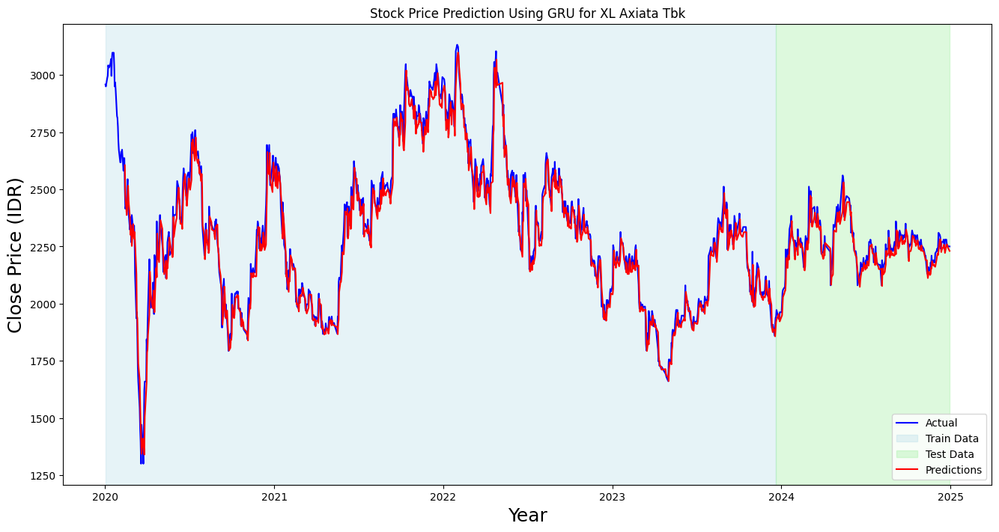

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'EXCL.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for XL Axiata Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_excl = pd.DataFrame(all_predictions, columns=["All Predictions Excl"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_excl)

# Jika ingin menyimpan ke file CSV
df_predictions_excl.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Excl
0              2605.405518
1              2474.736328
2              2387.464600
3              2407.032715
4              2472.699219
...                    ...
1176           2221.656006
1177           2252.954346
1178           2259.109375
1179           2242.222168
1180           2230.342773

[1181 rows x 1 columns]


##GGRM

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.0571
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.0020
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.9239e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.3850e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.3150e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.4961e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.1037e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.2375e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.5612e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 5.6059e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 6.3876e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 5.3250e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 5.5734e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.6224e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-57-717040b24247>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


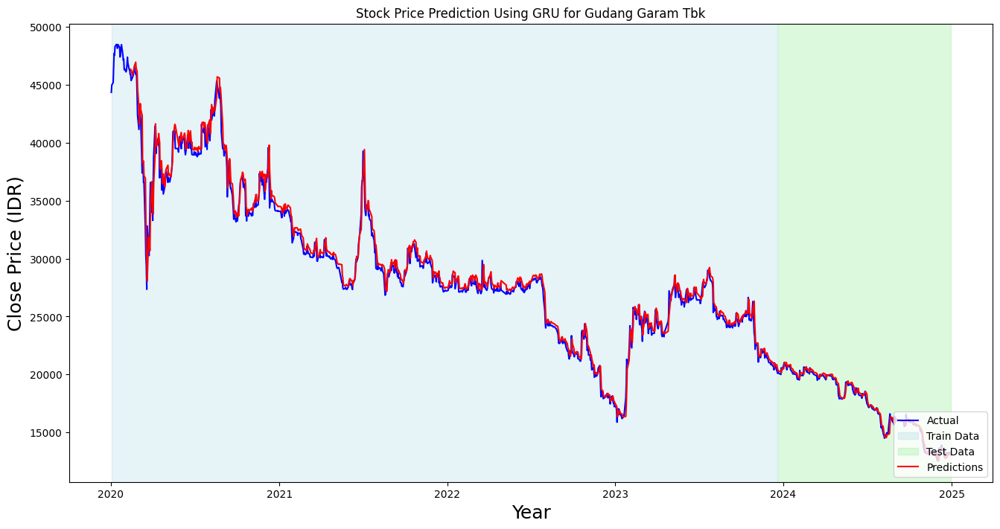

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'GGRM.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Gudang Garam Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_ggrm = pd.DataFrame(all_predictions, columns=["All Predictions Ggrm"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_ggrm)

# Jika ingin menyimpan ke file CSV
df_predictions_ggrm.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Ggrm
0             46332.742188
1             46299.324219
2             45822.042969
3             46030.609375
4             46165.527344
...                    ...
1176          12789.522461
1177          12981.796875
1178          13084.785156
1179          13069.147461
1180          13137.536133

[1181 rows x 1 columns]


##HRUM

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.0838
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 77ms/step - loss: 0.0016
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 8.3635e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 6.9831e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 6.6692e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 6.2131e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 7.4229e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 6.0428e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 5.7956e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 5.6209e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 6.4160e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 5.6593e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 5.3848e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 5.3622e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━

<ipython-input-60-497aee339e7c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


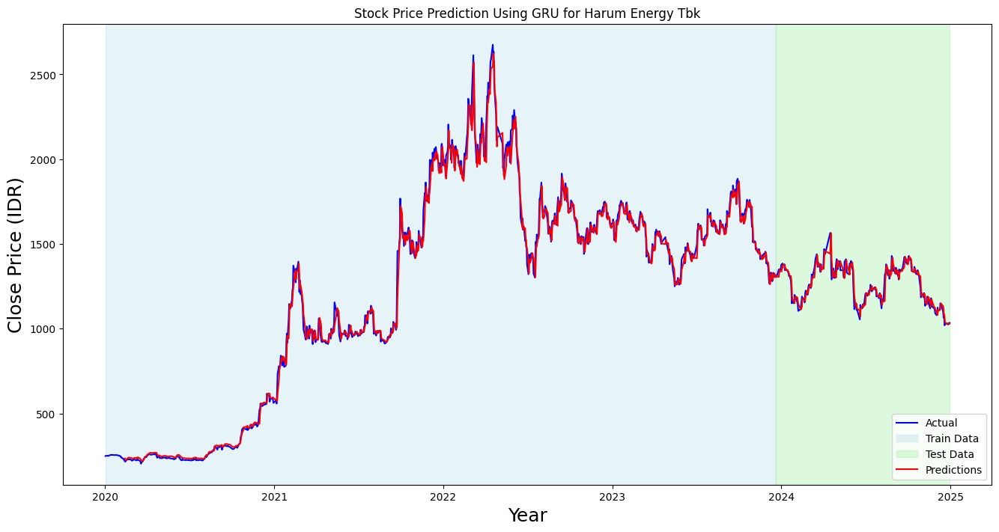

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'HRUM.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Harum Energy Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_hrum = pd.DataFrame(all_predictions, columns=["All Predictions Hrum"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_hrum)

# Jika ingin menyimpan ke file CSV
df_predictions_hrum.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Hrum
0               235.270386
1               229.925568
2               226.767090
3               231.643753
4               235.050827
...                    ...
1176           1039.831543
1177           1027.624512
1178           1030.080566
1179           1032.519897
1180           1030.114136

[1181 rows x 1 columns]


##ICBP

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0332
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0019
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - loss: 0.0011
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0010
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0011
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.5488e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.6170e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.8964e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.1126e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.2259e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 7.3838e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 7.2438e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.5125e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.9002e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms

<ipython-input-64-1af2107cba8a>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


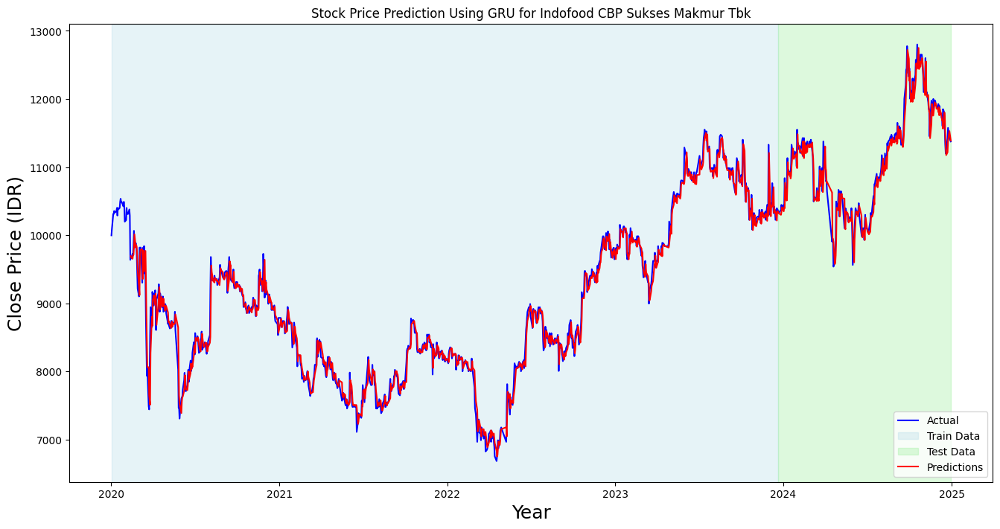

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ICBP.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Indofood CBP Sukses Makmur Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_icbp = pd.DataFrame(all_predictions, columns=["All Predictions Icbp"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_icbp)

# Jika ingin menyimpan ke file CSV
df_predictions_icbp.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Icbp
0              9693.535156
1              9673.089844
2              9653.401367
3              9705.027344
4              9709.484375
...                    ...
1176          11174.697266
1177          11216.491211
1178          11381.476562
1179          11528.034180
1180          11388.294922

[1181 rows x 1 columns]


##INCO

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - loss: 0.0796
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0029
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0011
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.3060e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.4897e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.8557e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.0680e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.3505e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.2215e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 6.1410e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 7.8728e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.9849e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 6.2204e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.2002e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━

<ipython-input-66-ad1041d865c1>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


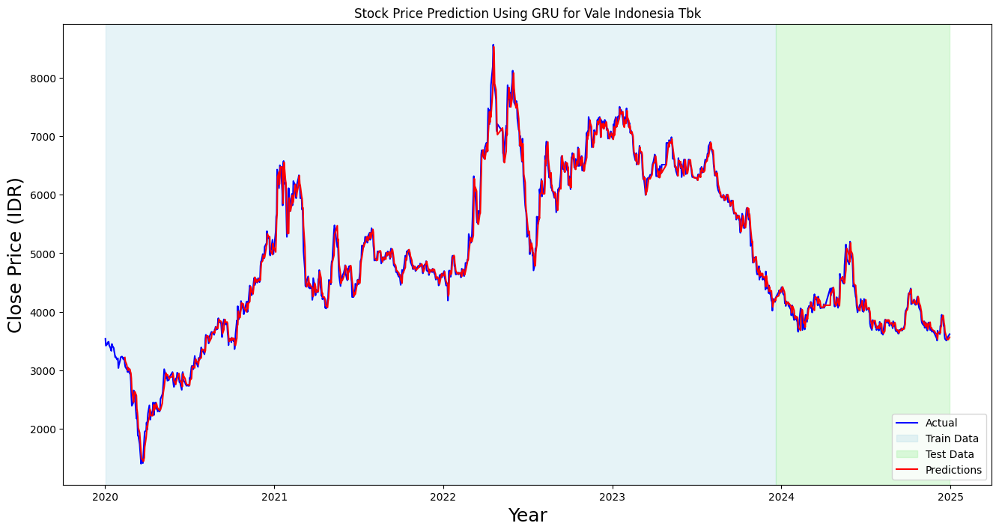

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'INCO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions
# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Vale Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_inco = pd.DataFrame(all_predictions, columns=["All Predictions Inco"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_inco)

# Jika ingin menyimpan ke file CSV
df_predictions_inco.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Inco
0              3221.081787
1              3158.032471
2              3099.604248
3              3052.893555
4              3035.936768
...                    ...
1176           3660.338379
1177           3579.072510
1178           3533.015381
1179           3526.489746
1180           3567.283691

[1181 rows x 1 columns]


##INDF

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0609
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0019
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0012
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.6428e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0010
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0010
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 7.9592e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 7.9735e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 9.1721e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.9662e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.5981e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.9205e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.7599e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.4409e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms

<ipython-input-69-7ddef07883d0>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


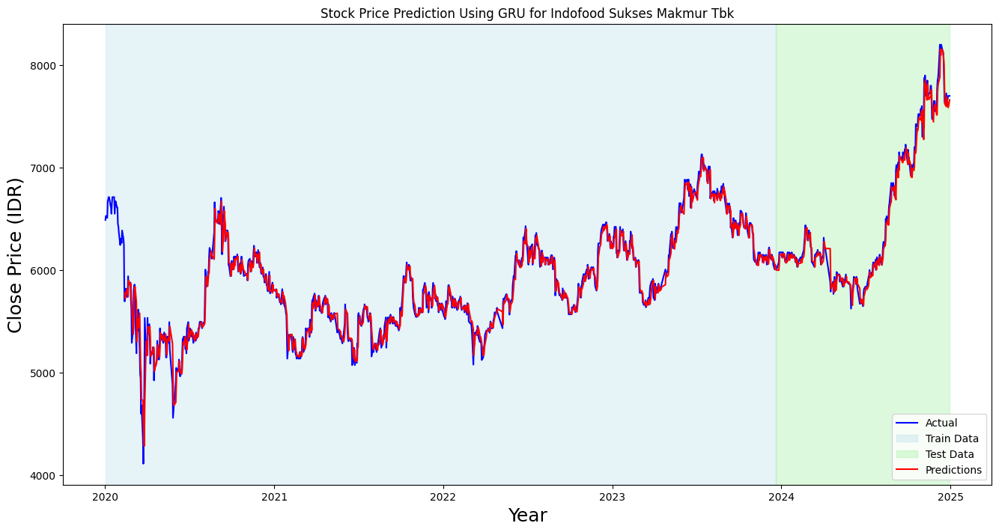

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'INDF.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions
# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Indofood Sukses Makmur Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_indf = pd.DataFrame(all_predictions, columns=["All Predictions Indf"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_indf)

# Jika ingin menyimpan ke file CSV
df_predictions_indf.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Indf
0              5775.359375
1              5721.149414
2              5806.810059
3              5814.317383
4              5780.218750
...                    ...
1176           7619.121094
1177           7594.541016
1178           7687.677246
1179           7586.119629
1180           7660.048340

[1181 rows x 1 columns]


##INKP

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0413
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0020
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 9.6469e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 8.7983e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 7.5356e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.5751e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.9634e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.6448e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.9601e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.5088e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.8874e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.9093e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 6.2038e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 5.7874e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-71-b36e154536ad>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


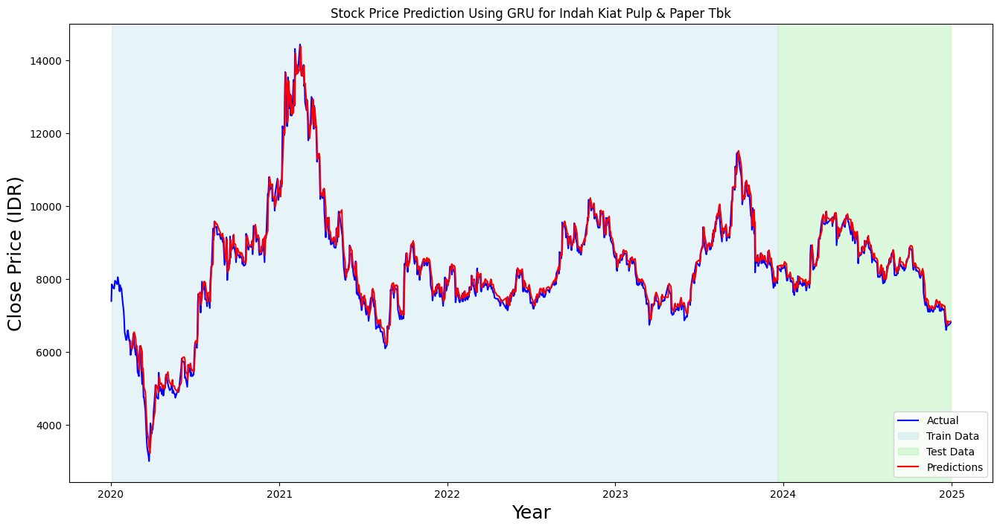

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'INKP.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions
# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Indah Kiat Pulp & Paper Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_inkp = pd.DataFrame(all_predictions, columns=["All Predictions Inkp"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_inkp)

# Jika ingin menyimpan ke file CSV
df_predictions_inkp.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Inkp
0              6289.139160
1              6090.941406
2              6097.510742
3              6207.610840
4              6382.270996
...                    ...
1176           6868.564453
1177           6734.462402
1178           6841.692871
1179           6824.444336
1180           6836.571289

[1181 rows x 1 columns]


##INTP

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0589
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0026
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0017
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0016
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0013
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0015
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0013
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0014
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.8848e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.7280e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0011
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.4945e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.8980e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.6975e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.

<ipython-input-75-9036815a0544>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


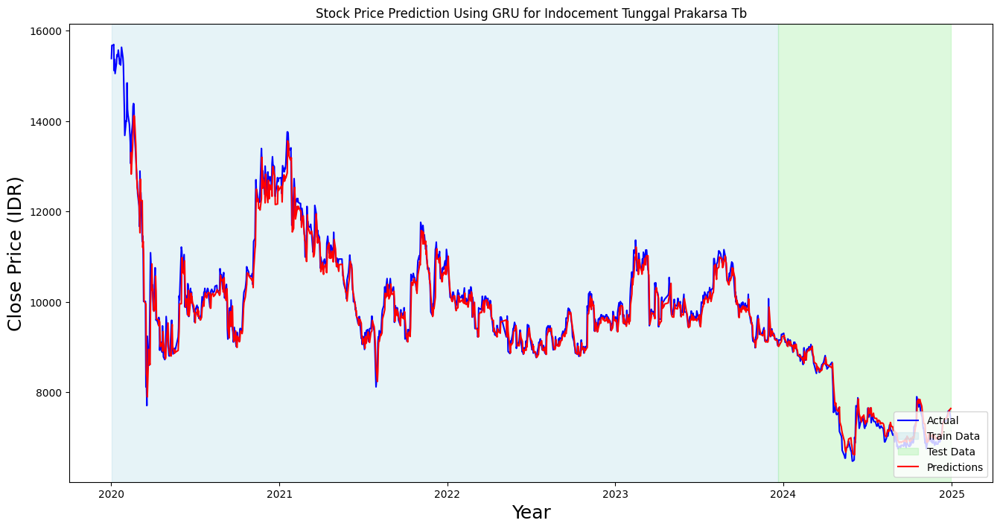

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'INTP.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Indocement Tunggal Prakarsa Tb')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_intp = pd.DataFrame(all_predictions, columns=["All Predictions Intp"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_intp)

# Jika ingin menyimpan ke file CSV
df_predictions_intp.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Intp
0             13297.524414
1             12825.883789
2             13434.055664
3             13723.703125
4             14094.821289
...                    ...
1176           7417.020508
1177           7451.712402
1178           7529.934570
1179           7602.805664
1180           7639.314453

[1181 rows x 1 columns]


##ITMG

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0821
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.5685e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.1204e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 3.8527e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 3.6154e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.3902e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.7720e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.2592e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.1623e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.2822e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 3.5164e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.8781e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 3.6249e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-78-eab55089f4e0>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


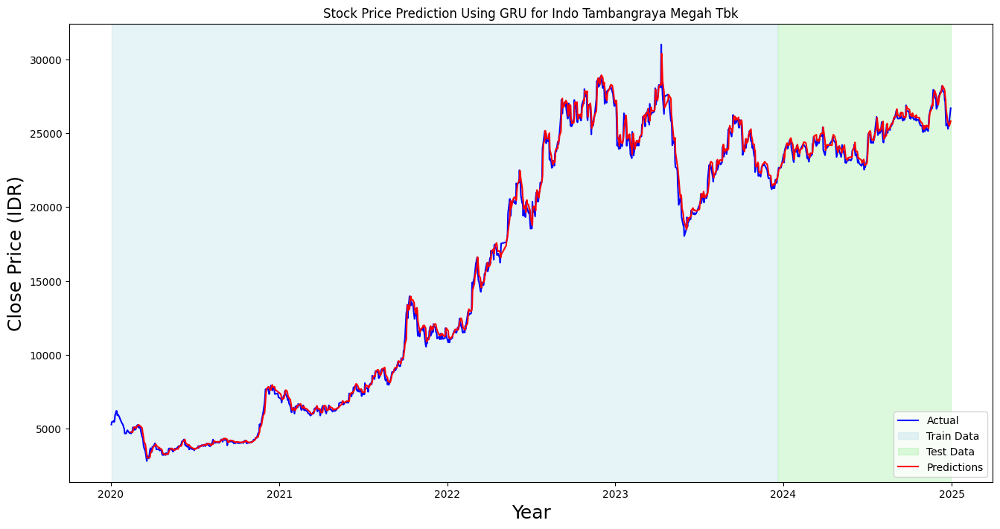

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ITMG.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Indo Tambangraya Megah Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_itmg = pd.DataFrame(all_predictions, columns=["All Predictions Itmg"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_itmg)

# Jika ingin menyimpan ke file CSV
df_predictions_itmg.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Itmg
0              4767.849609
1              4764.110840
2              4745.476562
3              4831.338867
4              4992.299805
...                    ...
1176          26647.220703
1177          25873.554688
1178          25743.708984
1179          25495.640625
1180          25825.289062

[1181 rows x 1 columns]


##KLBF

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0592
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0023
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.8006e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.3051e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.6938e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.9620e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 6.7966e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 7.4114e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.9539e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.9812e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.1007e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.7666e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.9292e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.7524e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-80-d31d8eec8f3d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


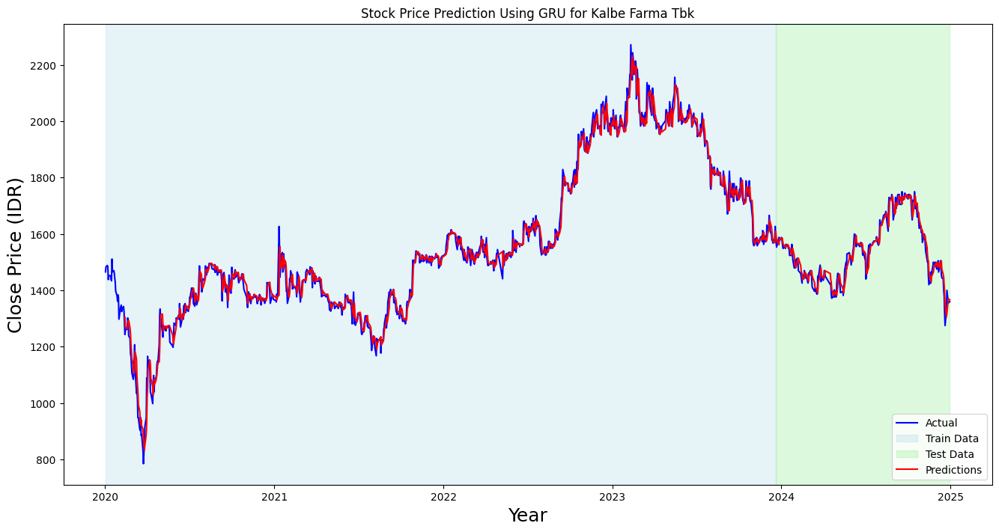

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'KLBF.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Kalbe Farma Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_klbf = pd.DataFrame(all_predictions, columns=["All Predictions Klbf"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_klbf)

# Jika ingin menyimpan ke file CSV
df_predictions_klbf.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Klbf
0              1304.581177
1              1269.733398
2              1265.313110
3              1265.508911
4              1268.593872
...                    ...
1176           1351.083130
1177           1305.793457
1178           1319.269897
1179           1369.982544
1180           1366.445557

[1181 rows x 1 columns]


##MAPI

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0625
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0013
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.1064e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 7.3888e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 6.2675e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 7.7430e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.7110e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.6229e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.9887e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.0707e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.1139e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.9441e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 4.8946e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 4.9611e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-83-a9c538330ef9>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


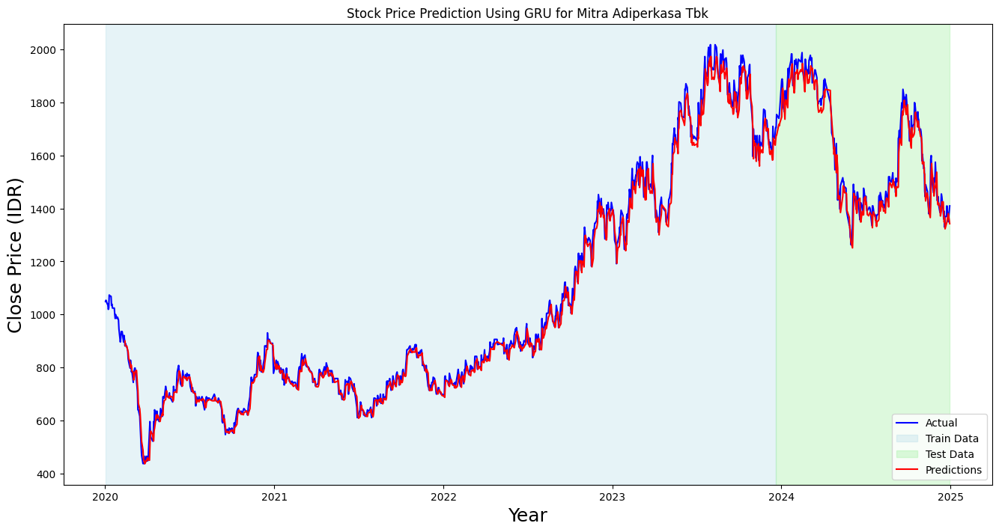

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'MAPI.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Mitra Adiperkasa Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_mapi = pd.DataFrame(all_predictions, columns=["All Predictions Mapi"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_mapi)

# Jika ingin menyimpan ke file CSV
df_predictions_mapi.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Mapi
0               899.819092
1               881.196045
2               880.810791
3               871.794678
4               865.235718
...                    ...
1176           1323.314331
1177           1343.517700
1178           1349.356445
1179           1381.200562
1180           1342.847778

[1181 rows x 1 columns]


##MDKA

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0510
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0018
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.0390e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.1029e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 6.3805e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 7.1071e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.8524e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.4455e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.7360e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 6.3893e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.0320e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 5.5625e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 6.0296e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 5.4479e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-85-ca86dc9046c6>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


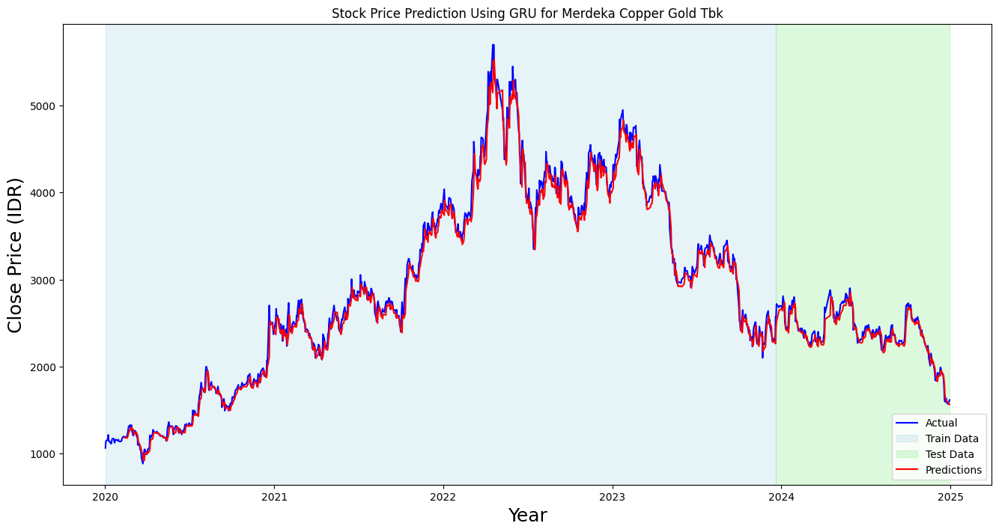

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'MDKA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Merdeka Copper Gold Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_mdka = pd.DataFrame(all_predictions, columns=["All Predictions Mdka"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_mdka)

# Jika ingin menyimpan ke file CSV
df_predictions_mdka.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Mdka
0              1180.483887
1              1179.993530
2              1179.622681
3              1176.887573
4              1190.794067
...                    ...
1176           1665.482788
1177           1604.333130
1178           1603.067383
1179           1579.524780
1180           1562.117310

[1181 rows x 1 columns]


##MEDC

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0442
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0015
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.9586e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.5296e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.2311e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.5411e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 7.0268e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 6.2303e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 7.0234e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 6.2610e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.7971e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.8799e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.7369e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.8731e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-88-90d6ae58280f>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


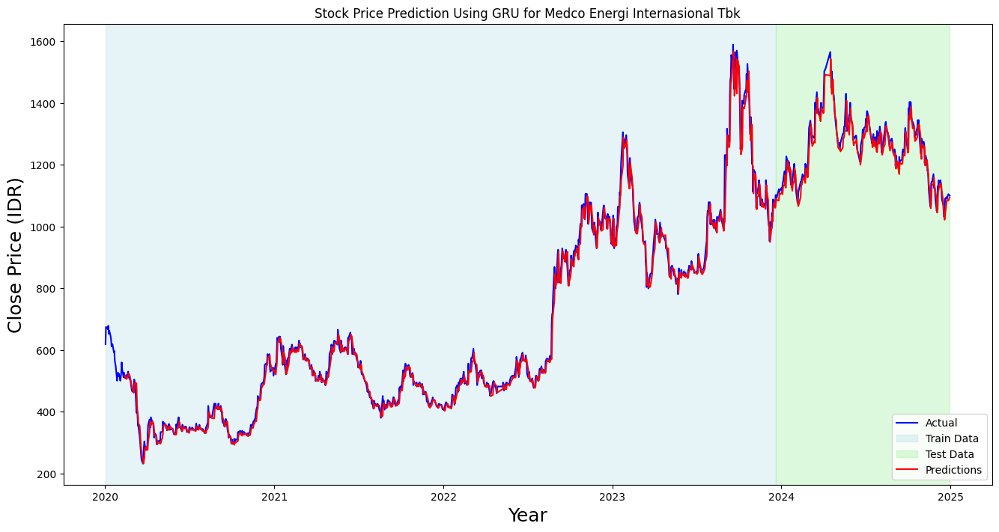

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'MEDC.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Medco Energi Internasional Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_medc = pd.DataFrame(all_predictions, columns=["All Predictions Medc"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_medc)

# Jika ingin menyimpan ke file CSV
df_predictions_medc.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Medc
0               516.711792
1               510.384369
2               505.628326
3               511.817657
4               514.547607
...                    ...
1176           1036.939697
1177           1075.202515
1178           1086.911499
1179           1083.469849
1180           1094.928589

[1181 rows x 1 columns]


##PGAS

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0986
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0046
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0016
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0011
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 9.3549e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 9.7516e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.8594e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.7338e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.2458e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.0315e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.9419e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.8781e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 8.0263e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 7.0135e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 

<ipython-input-90-610e4fe7fab8>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


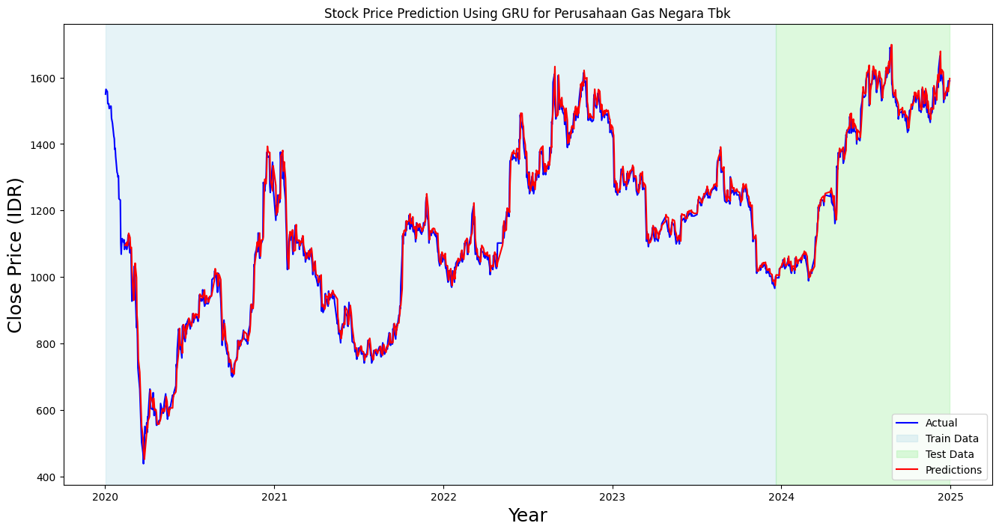

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'PGAS.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Perusahaan Gas Negara Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_pgas = pd.DataFrame(all_predictions, columns=["All Predictions Pgas"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_pgas)

# Jika ingin menyimpan ke file CSV
df_predictions_pgas.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Pgas
0              1095.358887
1              1094.341187
2              1104.566650
3              1093.496338
4              1095.384277
...                    ...
1176           1543.901489
1177           1557.001587
1178           1569.697266
1179           1557.398071
1180           1596.704590

[1181 rows x 1 columns]


##PTBA

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0320
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 6.4354e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.8375e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 5.6502e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 4.8132e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 5.0037e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 4.9837e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.8846e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 4.4758e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 4.7604e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 4.0513e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.0588e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 4.6029e-04
Epoch 15/30
30/30 ━━━━

<ipython-input-92-a4776baac27c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


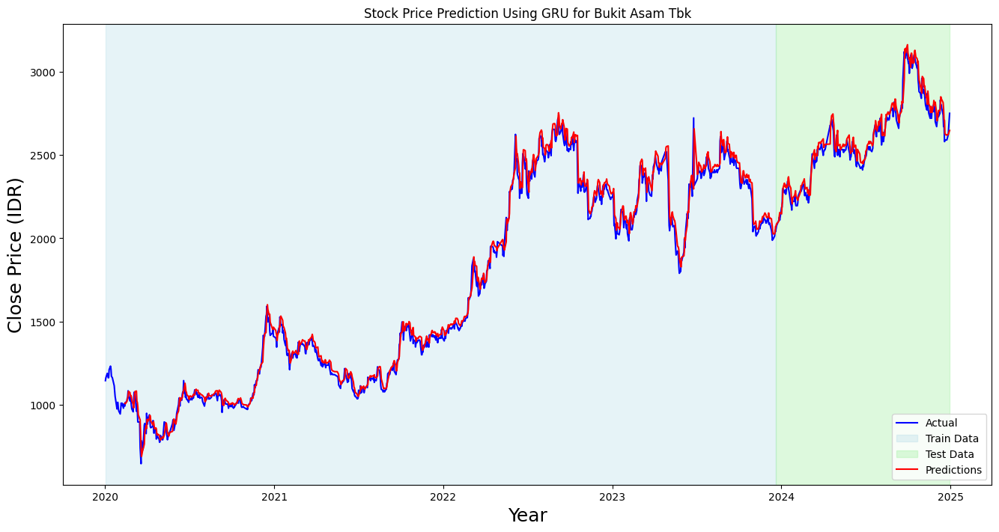

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'PTBA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Bukit Asam Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_ptba = pd.DataFrame(all_predictions, columns=["All Predictions Ptba"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_ptba)

# Jika ingin menyimpan ke file CSV
df_predictions_ptba.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Ptba
0              1008.863159
1              1006.851074
2              1018.633362
3              1027.618774
4              1041.472900
...                    ...
1176           2628.006348
1177           2618.565430
1178           2620.498535
1179           2622.182617
1180           2647.310547

[1181 rows x 1 columns]


##SIDO

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.0791
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0034
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0011
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.9247e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 8.8814e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.5870e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.3391e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.5784e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 7.6348e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 7.1726e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 6.4306e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.5746e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.6584e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.1629e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━

<ipython-input-94-f77bbf952e62>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


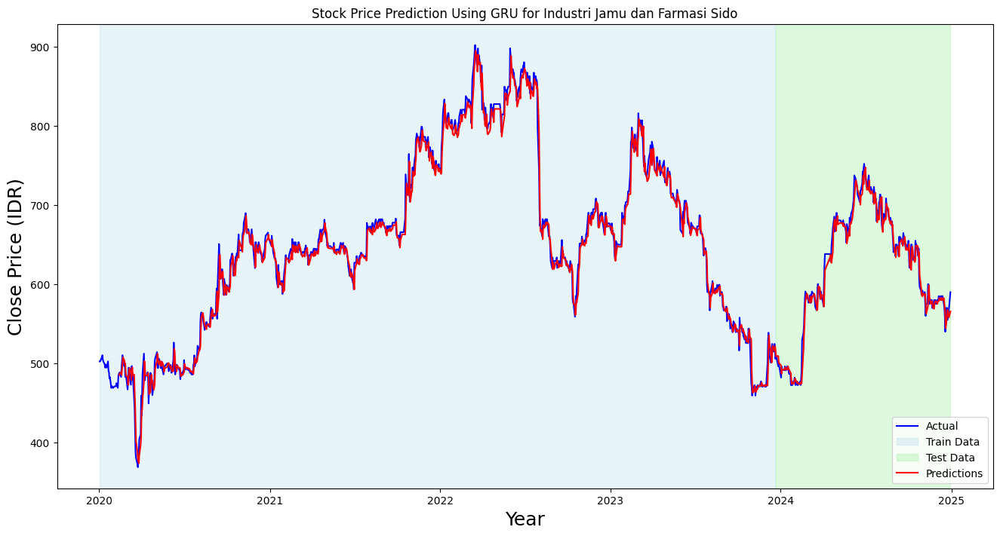

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'SIDO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Industri Jamu dan Farmasi Sido')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_sido = pd.DataFrame(all_predictions, columns=["All Predictions Sido"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_sido)

# Jika ingin menyimpan ke file CSV
df_predictions_sido.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Sido
0               485.248077
1               487.228485
2               488.878326
3               485.456116
4               491.675751
...                    ...
1176            544.259033
1177            560.850769
1178            567.621521
1179            558.174988
1180            565.615601

[1181 rows x 1 columns]


##SMGR

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0939
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0040
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0015
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0011
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.7270e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.6094e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.9534e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 8.4501e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.0347e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.4807e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.4530e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.2887e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 8.1215e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.8436e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 

<ipython-input-98-f8c8eb082caf>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


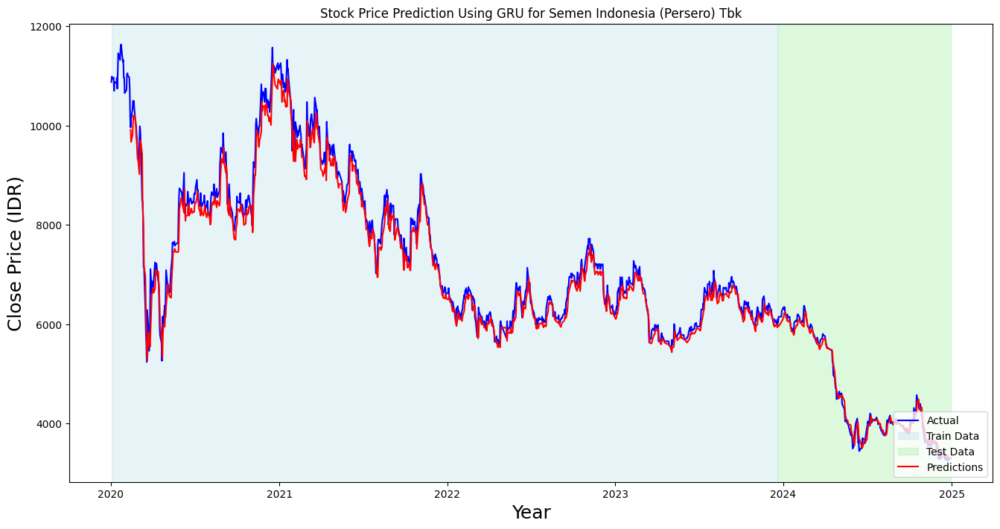

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'SMGR.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Semen Indonesia (Persero) Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_smgr = pd.DataFrame(all_predictions, columns=["All Predictions Smgr"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_smgr)

# Jika ingin menyimpan ke file CSV
df_predictions_smgr.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Smgr
0              9910.114258
1              9665.728516
2              9802.627930
3             10001.881836
4             10193.504883
...                    ...
1176           3336.804932
1177           3305.448486
1178           3330.835938
1179           3300.702637
1180           3305.522461

[1181 rows x 1 columns]


##SRTG

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0678
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0017
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 8.4745e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.5630e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.1874e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.6368e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 5.7395e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 8.2480e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.6128e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.3123e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 6.8322e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 4.6189e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.6353e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.1153e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-100-fd54b6ea3ae9>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


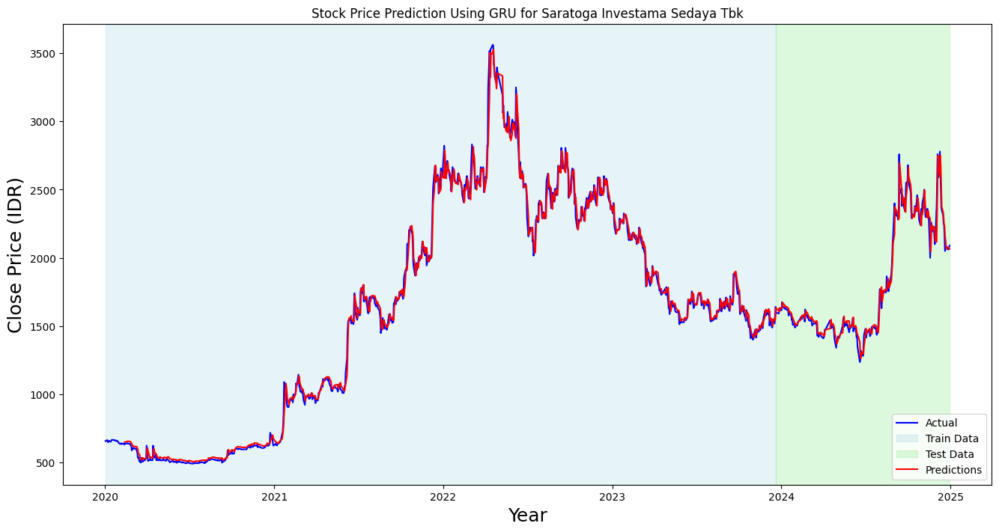

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'SRTG.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Saratoga Investama Sedaya Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_srtg = pd.DataFrame(all_predictions, columns=["All Predictions Srtg"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_srtg)

# Jika ingin menyimpan ke file CSV
df_predictions_srtg.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Srtg
0               648.981812
1               649.301086
2               651.914795
3               653.270691
4               653.775024
...                    ...
1176           2168.223877
1177           2065.611084
1178           2070.518311
1179           2077.310303
1180           2064.743164

[1181 rows x 1 columns]


##TLKM

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - loss: 0.1262
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0051
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - loss: 0.0014
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.9358e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0011
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.9493e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0010
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 9.9310e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.8101e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 9.0247e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 8.1033e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.9008e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 8.7702e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.1524e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms

<ipython-input-103-7076af46f91c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


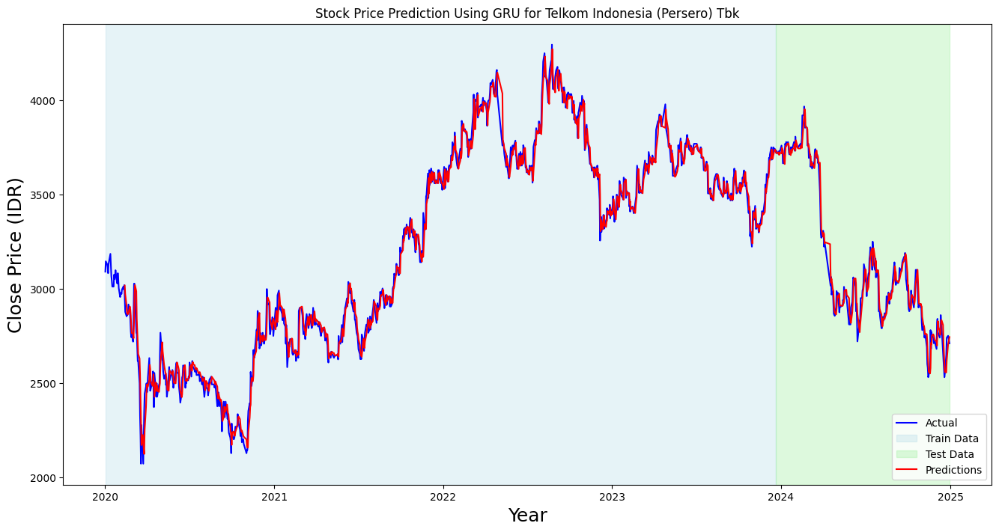

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'TLKM.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Telkom Indonesia (Persero) Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_tlkm = pd.DataFrame(all_predictions, columns=["All Predictions Tlkm"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_tlkm)

# Jika ingin menyimpan ke file CSV
df_predictions_tlkm.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Tlkm
0              3016.749512
1              2971.620605
2              2907.119873
3              2870.333740
4              2865.043213
...                    ...
1176           2558.049561
1177           2554.939453
1178           2618.461426
1179           2703.896729
1180           2743.071533

[1181 rows x 1 columns]


##TOWR

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0783
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0031
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.0012
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 9.4626e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 7.9993e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.8186e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 8.1578e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.7094e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.4102e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.7444e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 6.8256e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 6.0901e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.3861e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.8500e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━

<ipython-input-106-f7ce536e0529>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


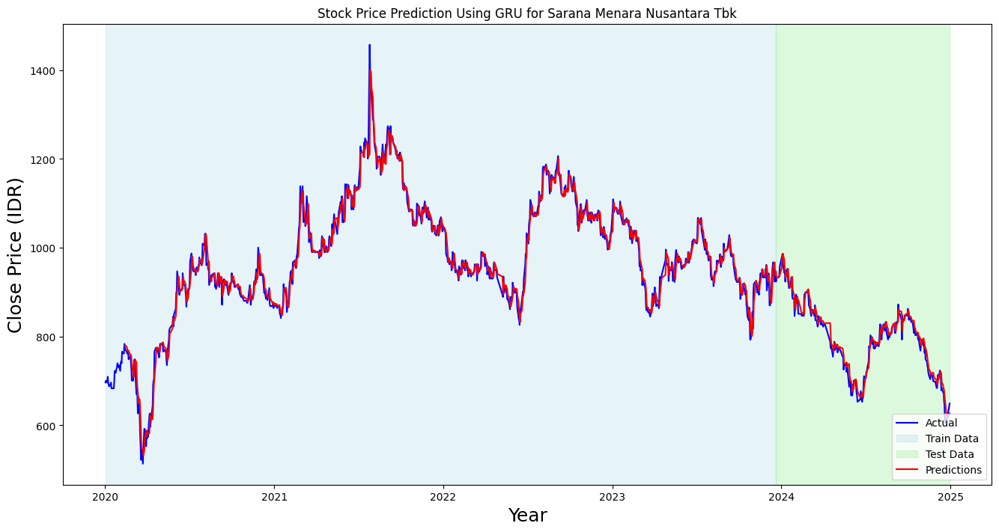

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'TOWR.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Sarana Menara Nusantara Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_towr = pd.DataFrame(all_predictions, columns=["All Predictions Towr"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_towr)

# Jika ingin menyimpan ke file CSV
df_predictions_towr.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Towr
0               779.635986
1               780.341492
2               777.053650
3               772.723206
4               768.241211
...                    ...
1176            656.372253
1177            629.422852
1178            618.890930
1179            618.277710
1180            627.200439

[1181 rows x 1 columns]


##UNTR

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - loss: 0.0988
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0033
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 7.0547e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 8.1456e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 5.7028e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 6.8631e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.9503e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 5.5840e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 7.3352e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.5237e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.5190e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 6.4097e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 5.5957e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.9427e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-108-d5e13a9be42f>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


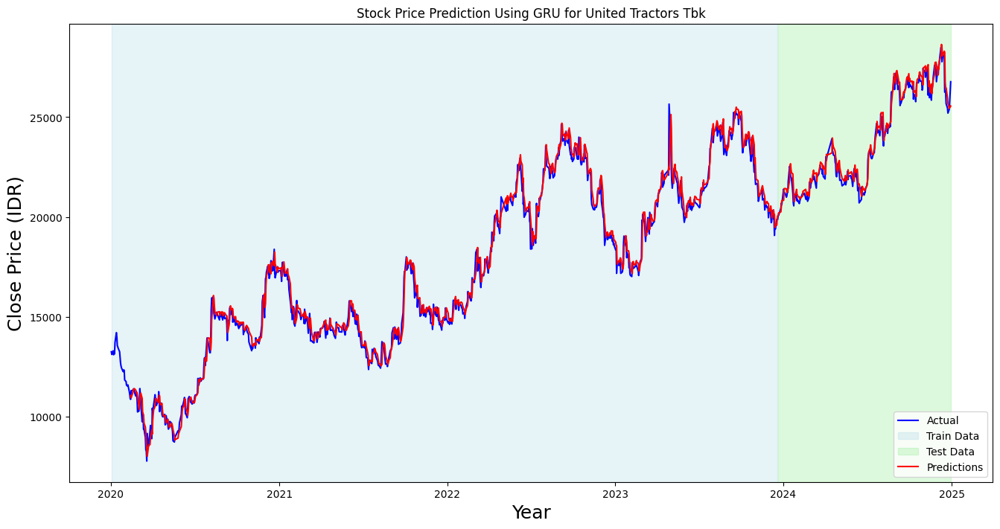

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'UNTR.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for United Tractors Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_untr = pd.DataFrame(all_predictions, columns=["All Predictions Untr"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_untr)

# Jika ingin menyimpan ke file CSV
df_predictions_untr.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Untr
0             11043.048828
1             10930.842773
2             11141.118164
3             11271.714844
4             11323.486328
...                    ...
1176          26464.275391
1177          25968.755859
1178          25682.455078
1179          25434.140625
1180          25556.505859

[1181 rows x 1 columns]


##UNVR

[*********************100%***********************]  1 of 1 completed

Epoch 1/30



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - loss: 0.0697
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0022
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 8.1844e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 6.6613e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 5.9502e-04
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 5.9422e-04
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 5.7263e-04
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 5.6557e-04
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.1152e-04
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 5.3732e-04
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 5.4902e-04
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.9689e-04
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 4.5658e-04
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 5.1528e-04
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-112-cc4ff3cebe80>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


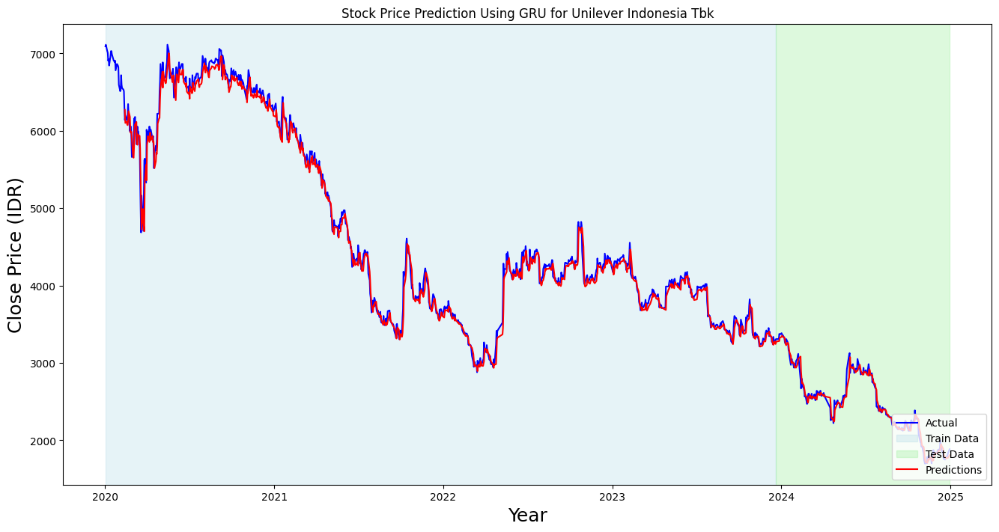

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'UNVR.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=30, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=80, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=80, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

# Plot hasil prediksi
plt.figure(figsize=(16, 8))
plt.title(f'Stock Price Prediction Using GRU for Unilever Indonesia Tbk')
plt.xlabel('Year', fontsize=18)
plt.ylabel('Close Price (IDR)', fontsize=18)

# Plot seluruh data aktual dengan garis hitam
plt.plot(data.index, data['Close'], color='blue', label='Actual')

# Mengatur latar belakang area Train dan Test
plt.axvspan(train.index[0], train.index[-1], color='lightblue', alpha=0.3, label='Train Data')
plt.axvspan(valid.index[0], valid.index[-1], color='lightgreen', alpha=0.3, label='Test Data')

# Plot data prediksi
plt.plot(data.index, all_predictions, color='red', label='Predictions')

# Menampilkan legend
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Menggabungkan prediksi training dan testing
all_predictions = np.concatenate((prediction_train.flatten(), predictions.flatten()), axis=0)

# Membuat DataFrame
df_predictions_unvr = pd.DataFrame(all_predictions, columns=["All Predictions Unvr"])

# Menampilkan DataFrame hasil gabungan
print(df_predictions_unvr)

# Jika ingin menyimpan ke file CSV
df_predictions_unvr.to_csv("gabungan_prediksi.csv", index=False)


      All Predictions Unvr
0              6271.741211
1              6101.631348
2              6119.765625
3              6081.300293
4              6073.800781
...                    ...
1176           1781.606567
1177           1763.554321
1178           1771.627319
1179           1775.976562
1180           1807.668579

[1181 rows x 1 columns]


###Download Seluruh Data Prediksi Saham

In [ ]:
import pandas as pd
import numpy as np
import datetime as datetime

df_predictions = pd.DataFrame({
    'ACES': df_predictions_aces['All Predictions Aces'],
    'ADRO': df_predictions_adro['All Predictions Adro'],
    'AKRA': df_predictions_akra['All Predictions Akra'],
    'AMRT': df_predictions_amrt['All Predictions Amrt'],
    'ANTM': df_predictions_antm['All Predictions Antm'],
    'ARTO': df_predictions_arto['All Predictions Arto'],
    'ASII': df_predictions_asii['All Predictions Asii'],
    'BBCA': df_predictions_bbca['All Predictions Bbca'],
    'BBNI': df_predictions_bbni['All Predictions Bbni'],
    'BBRI': df_predictions_bbri['All Predictions Bbri'],
    'BBTN': df_predictions_bbtn['All Predictions Bbtn'],
    'BMRI': df_predictions_bmri['All Predictions Bmri'],
    'BRIS': df_predictions_bris['All Predictions Bris'],
    'BRPT': df_predictions_brpt['All Predictions Brpt'],
    'CPIN': df_predictions_cpin['All Predictions Cpin'],
    'EMTK': df_predictions_emtk['All Predictions Emtk'],
    'ESSA': df_predictions_essa['All Predictions Essa'],
    'EXCL': df_predictions_excl['All Predictions Excl'],
    'GGRM': df_predictions_ggrm['All Predictions Ggrm'],
    'HRUM': df_predictions_hrum['All Predictions Hrum'],
    'ICBP': df_predictions_icbp['All Predictions Icbp'],
    'INCO': df_predictions_inco['All Predictions Inco'],
    'INDF': df_predictions_indf['All Predictions Indf'],
    'INKP': df_predictions_inkp['All Predictions Inkp'],
    'INTP': df_predictions_intp['All Predictions Intp'],
    'ITMG': df_predictions_itmg['All Predictions Itmg'],
    'KLBF': df_predictions_klbf['All Predictions Klbf'],
    'MAPI': df_predictions_mapi['All Predictions Mapi'],
    'MDKA': df_predictions_mdka['All Predictions Mdka'],
    'MEDC': df_predictions_medc['All Predictions Medc'],
    'PGAS': df_predictions_pgas['All Predictions Pgas'],
    'PTBA': df_predictions_ptba['All Predictions Ptba'],
    'SIDO': df_predictions_sido['All Predictions Sido'],
    'SMGR': df_predictions_smgr['All Predictions Smgr'],
    'SRTG': df_predictions_srtg['All Predictions Srtg'],
    'TLKM': df_predictions_tlkm['All Predictions Tlkm'],
    'TOWR': df_predictions_towr['All Predictions Towr'],
    'UNTR': df_predictions_untr['All Predictions Untr'],
    'UNVR': df_predictions_unvr['All Predictions Unvr']
})

print(df_predictions)

             ACES         ADRO         AKRA         AMRT         ANTM  \
0     1350.421753   487.577271   473.971649   737.628845   615.165405   
1     1367.448853   494.795776   461.701508   738.797791   597.289246   
2     1395.394287   491.719482   455.205750   741.806458   584.805237   
3     1403.179199   489.118073   454.877167   741.801758   581.625000   
4     1360.827515   490.075745   457.486053   733.301147   585.807800   
...           ...          ...          ...          ...          ...   
1176   798.926880  2532.664062  1116.671265  2748.896973  1474.675659   
1177   790.507446  2532.216309  1115.499023  2726.280029  1428.523071   
1178   797.681519  2525.354736  1109.247681  2813.224365  1439.035400   
1179   790.522949  2499.566162  1100.279663  2759.833984  1432.187744   
1180   787.855591  2517.736084  1097.496094  2741.130371  1494.032959   

             ARTO         ASII         BBCA         BBNI         BBRI  ...  \
0      405.784149  4390.361816  6132.430176  

In [ ]:
from google.colab import files

# Menyimpan DataFrame ke file CSV
df_predictions.to_csv('Data Prediksi.csv', index=False)

# Unduh file CSV
files.download('Data Prediksi.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###**Arsitektur GRU**

In [ ]:
import pydot

# Buat diagram dasar
dot = pydot.Dot()
dot.set('rankdir', 'LR')  # Tata letak dari kiri ke kanan

# Node awal (Gambar input saham)
image_node = pydot.Node(
    "Stock Data\n(Close)",
    shape="ellipse",
    style="filled",
    fillcolor="lightblue",
)
dot.add_node(image_node)

# Daftar saham yang akan dimasukkan ke dalam input layer
saham_list = [
    'ACES', 'ADRO', 'AKRA', 'AMRT', 'ANTM', 'ARTO', 'ASII', 'BBCA', 'BBNI', 'BBRI',
    'BBTN', 'BMRI', 'BRIS', 'BRPT', 'CPIN', 'EMTK', 'ESSA', 'EXCL', 'GGRM', 'HRUM',
    'ICBP', 'INCO', 'INDF', 'INKP', 'INTP', 'ITMG', 'KLBF', 'MAPI', 'MDKA', 'MEDC',
    'PGAS', 'PTBA', 'SIDO', 'SMGR', 'SRTG', 'TLKM', 'TOWR', 'UNTR', 'UNVR'
]

# Tambahkan node untuk setiap saham dalam input layer
input_nodes = []
for i, saham in enumerate(saham_list, start=1):
    stock_node = pydot.Node(
        f"X{i}\n{saham}",
        shape="box",
        style="filled",
        fillcolor="lightgrey",
    )
    dot.add_node(stock_node)
    input_nodes.append(stock_node)
    dot.add_edge(pydot.Edge(image_node, stock_node))

# Tambahkan node untuk GRU Layer
gru_node = pydot.Node(
    "GRU Layer\n(Predictions Stock Price)",
    shape="box",
    style="filled",
    fillcolor="lightgreen",
)
dot.add_node(gru_node)

# Hubungkan semua input node ke GRU Layer
for node in input_nodes:
    dot.add_edge(pydot.Edge(node, gru_node))

# Tambahkan Dropout Layer
dropout_node = pydot.Node(
    "Dropout Layer\n(p = 0.25)",
    shape="ellipse",
    style="filled",
    fillcolor="yellow",
)
dot.add_node(dropout_node)
dot.add_edge(pydot.Edge(gru_node, dropout_node))

# Tambahkan Fully Connected Layer
fc_node = pydot.Node(
    "Fully Connected Layer\n(Sigmoid Activation)",
    shape="box",
    style="filled",
    fillcolor="pink",
)
dot.add_node(fc_node)
dot.add_edge(pydot.Edge(dropout_node, fc_node))

# Tambahkan Output Layer
output_node = pydot.Node(
    "Output Layer\n(Predicted Portfolio Optimization)",
    shape="ellipse",
    style="filled",
    fillcolor="lightcoral",
)
dot.add_node(output_node)
dot.add_edge(pydot.Edge(fc_node, output_node))

# Simpan diagram ke file PNG
diagram_filename = "gru_architecture_complete.png"
dot.write_png(diagram_filename)

print(f"Diagram arsitektur berhasil disimpan sebagai {diagram_filename}.")


Diagram arsitektur berhasil disimpan sebagai gru_architecture_complete.png.


In [ ]:
import pydot

# Buat diagram dasar
dot = pydot.Dot()
dot.set('rankdir', 'LR')  # Tata letak dari kiri ke kanan

# Tambahkan node untuk input data saham
image_node = pydot.Node(
    "Stock Data\n(Close)",
    shape="ellipse",
    style="filled",
    fillcolor="lightgrey",
)
dot.add_node(image_node)

# Daftar saham yang akan dimasukkan
saham_list = [
    'ACES', 'ADRO', 'AKRA', 'AMRT', 'ANTM', 'ARTO', 'ASII', 'BBCA', 'BBNI', 'BBRI',
    'BBTN', 'BMRI', 'BRIS', 'BRPT', 'CPIN', 'EMTK', 'ESSA', 'EXCL', 'GGRM', 'HRUM',
    'ICBP', 'INCO', 'INDF', 'INKP', 'INTP', 'ITMG', 'KLBF', 'MAPI', 'MDKA', 'MEDC',
    'PGAS', 'PTBA', 'SIDO', 'SMGR', 'SRTG', 'TLKM', 'TOWR', 'UNTR', 'UNVR'
]

# Buat input node untuk 6 saham teratas
for i, saham in enumerate(saham_list[:6], start=1):  # Hanya ambil 6 teratas
    stock_node = pydot.Node(
        f"X{i}\n{saham}",
        shape="box",
        style="filled",
        fillcolor="lightgrey",
    )
    dot.add_node(stock_node)
    dot.add_edge(pydot.Edge(image_node, stock_node))

# Tambahkan node "..." untuk mewakili saham di tengah
dots_node = pydot.Node(
    "...",
    shape="ellipse",
    style="filled",
    fillcolor="lightgrey",
)
dot.add_node(dots_node)
dot.add_edge(pydot.Edge(image_node, dots_node))

# Tambahkan input node untuk 2 saham terakhir
for i, saham in enumerate(saham_list[-2:], start=len(saham_list) - 1):  # 2 terakhir
    stock_node = pydot.Node(
        f"X{i}\n{saham}",
        shape="box",
        style="filled",
        fillcolor="lightgrey",
    )
    dot.add_node(stock_node)
    dot.add_edge(pydot.Edge(image_node, stock_node))

# Tambahkan node GRU Layer
gru_node = pydot.Node(
    "GRU Layer\n(Predictions Stock Price)",
    shape="box",
    style="filled",
    fillcolor="lightgrey",
)
dot.add_node(gru_node)

# Hubungkan semua input node (6 saham + "..." + 2 saham terakhir) ke GRU Layer
for i in range(1, 7):  # Sambungkan 6 saham pertama
    dot.add_edge(pydot.Edge(f"X{i}\n{saham_list[i-1]}", gru_node))
dot.add_edge(pydot.Edge(dots_node, gru_node))  # Sambungkan "..."
for i, saham in enumerate(saham_list[-2:], start=len(saham_list) - 1):  # Sambungkan 2 terakhir
    dot.add_edge(pydot.Edge(f"X{i}\n{saham}", gru_node))

# Tambahkan Fully Connected Layer dan Output Layer
fc_node = pydot.Node(
    "Fully Connected Layer\n(Sigmoid Activation)",
    shape="box",
    style="filled",
    fillcolor="lightgrey",
)
output_node = pydot.Node(
    "Output Layer\n(Predicted Portfolio Optimization)",
    shape="ellipse",
    style="filled",
    fillcolor="lightgrey",
)

dot.add_node(fc_node)
dot.add_node(output_node)

dot.add_edge(pydot.Edge(gru_node, fc_node))
dot.add_edge(pydot.Edge(fc_node, output_node))

# Simpan diagram ke file PNG
diagram_filename = "gru_architecture_no_dropout.png"
dot.write_png(diagram_filename)

print(f"Diagram arsitektur berhasil disimpan sebagai {diagram_filename}.")

Diagram arsitektur berhasil disimpan sebagai gru_architecture_no_dropout.png.


#**Return Actual Data and Prediction Data**

##Mean Variance Covariance

###Return

In [ ]:
import pandas as pd
import numpy as np

# Pastikan data prediksi dalam bentuk DataFrame
# Remove parentheses from df_predictions_aces and df_predictions_adro
df_predictions = pd.read_csv("Data Prediksi.csv")

# Hitung return harian
df_returns = df_predictions.pct_change().dropna()

print(df_returns)  # Cek hasil return

          ACES      ADRO      AKRA      AMRT      ANTM      ARTO      ASII  \
1     0.012609  0.014805 -0.025888  0.001585 -0.029059 -0.000134 -0.008216   
2     0.020436 -0.006217 -0.014069  0.004072 -0.020901 -0.005438  0.018283   
3     0.005579 -0.005290 -0.000722 -0.000006 -0.005438 -0.003060  0.006824   
4    -0.030183  0.001958  0.005735 -0.011459  0.007192  0.028009  0.001611   
5    -0.020328 -0.009163 -0.007452  0.005256  0.016914  0.027490  0.019227   
...        ...       ...       ...       ...       ...       ...       ...   
1176 -0.016996 -0.009485 -0.041899 -0.007322 -0.022029 -0.056718 -0.019133   
1177 -0.010538 -0.000177 -0.001050 -0.008228 -0.031297 -0.056908 -0.006249   
1178  0.009075 -0.002710 -0.005604  0.031891  0.007359  0.017384  0.012901   
1179 -0.008974 -0.010212 -0.008085 -0.018978 -0.004759  0.011941 -0.007423   
1180 -0.003374  0.007269 -0.002530 -0.006777  0.043182 -0.002794  0.006035   

          BBCA      BBNI      BBRI  ...      MEDC      PGAS    

In [ ]:
#Rata rata Prediksi
mean_returns = df_predictions.mean()
print(mean_returns)

ACES      940.311297
ADRO     1166.627084
AKRA      924.610764
AMRT     1849.806859
ANTM     1584.329653
ARTO     6040.421505
ASII     4655.488682
BBCA     7598.453408
BBNI     3733.517365
BBRI     3877.303421
BBTN     1243.946365
BMRI     4164.732858
BRIS     1698.538878
BRPT      955.911718
CPIN     5374.636096
EMTK     1171.128204
ESSA      576.839351
EXCL     2280.934915
GGRM    26948.560550
HRUM     1250.279401
ICBP     9365.212699
INCO     4979.660396
INDF     5983.087778
INKP     8393.230100
INTP     9623.071103
ITMG    16810.599570
KLBF     1564.584311
MAPI     1132.851384
MDKA     2851.350129
MEDC      777.982310
PGAS     1158.307969
PTBA     1900.778903
SIDO      645.483011
SMGR     6767.265749
SRTG     1676.374588
TLKM     3224.343157
TOWR      948.725646
UNTR    18758.937080
UNVR     4171.366760
dtype: float64


In [ ]:
#Mean Return
def mean_returns(df, length):
    return df.sum(axis=0) / length

# Hitung mean return untuk semua saham
mean_return_all = mean_returns(df_returns, len(df_returns))

# Cetak hasil mean return untuk setiap saham
for stock, mean_return in mean_return_all.items():
    print(f"Mean Return {stock}: {mean_return:.6f}")

Mean Return ACES: -0.000265
Mean Return ADRO: 0.001620
Mean Return AKRA: 0.000866
Mean Return AMRT: 0.001217
Mean Return ANTM: 0.001054
Mean Return ARTO: 0.002123
Mean Return ASII: 0.000221
Mean Return BBCA: 0.000461
Mean Return BBNI: 0.000416
Mean Return BBRI: 0.000314
Mean Return BBTN: 0.000025
Mean Return BMRI: 0.000627
Mean Return BRIS: 0.002432
Mean Return BRPT: 0.000414
Mean Return CPIN: -0.000001
Mean Return EMTK: 0.000414
Mean Return ESSA: 0.001594
Mean Return EXCL: 0.000120
Mean Return GGRM: -0.000913
Mean Return HRUM: 0.001599
Mean Return ICBP: 0.000243
Mean Return INCO: 0.000339
Mean Return INDF: 0.000332
Mean Return INKP: 0.000334
Mean Return INTP: -0.000255
Mean Return ITMG: 0.001581
Mean Return KLBF: 0.000131
Mean Return MAPI: 0.000574
Mean Return MDKA: 0.000489
Mean Return MEDC: 0.001022
Mean Return PGAS: 0.000558
Mean Return PTBA: 0.000982
Mean Return SIDO: 0.000246
Mean Return SMGR: -0.000747
Mean Return SRTG: 0.001292
Mean Return TLKM: 0.000013
Mean Return TOWR: -0.00

###Variansi dan Kovariansi

In [ ]:
# Menghitung varians
variances = df_returns.var()

# Menghitung matriks kovarians
cov_matrix = df_returns.cov()

print("Varians:")
print(variances)

print("\nMatriks Kovarians:")
print(cov_matrix)


Varians:
ACES    0.000385
ADRO    0.000457
AKRA    0.000311
AMRT    0.000211
ANTM    0.000615
ARTO    0.001323
ASII    0.000250
BBCA    0.000122
BBNI    0.000282
BBRI    0.000221
BBTN    0.000455
BMRI    0.000194
BRIS    0.001084
BRPT    0.001363
CPIN    0.000354
EMTK    0.000817
ESSA    0.001044
EXCL    0.000507
GGRM    0.000312
HRUM    0.000708
ICBP    0.000214
INCO    0.000510
INDF    0.000187
INKP    0.000533
INTP    0.000433
ITMG    0.000299
KLBF    0.000185
MAPI    0.000473
MDKA    0.000510
MEDC    0.000780
PGAS    0.000481
PTBA    0.000331
SIDO    0.000234
SMGR    0.000370
SRTG    0.000637
TLKM    0.000188
TOWR    0.000218
UNTR    0.000296
UNVR    0.000268
dtype: float64

Matriks Kovarians:
          ACES      ADRO      AKRA      AMRT      ANTM      ARTO      ASII  \
ACES  0.000385  0.000049  0.000063  0.000021  0.000073  0.000068  0.000073   
ADRO  0.000049  0.000457  0.000117  0.000025  0.000185  0.000091  0.000089   
AKRA  0.000063  0.000117  0.000311  0.000012  0.000134  0.0

###Bobot dan Portofolio

In [ ]:
import numpy as np
import pandas as pd

# Misalkan df_returns adalah dataframe yang berisi return saham
# Pastikan df_returns sudah diisi dengan data return saham sebelum menjalankan kode ini.

# Matriks kovarians
cov_matrix = df_returns.cov()

# Mean return untuk semua saham
mean_return_all = df_returns.mean()

# Jumlah saham dalam portofolio
n_saham = len(df_returns.columns)

# Bobot yang sama untuk setiap saham
bobot = np.ones(n_saham) / n_saham

# Hitung expected return dengan bobot sama
expected_return = np.sum(bobot * mean_return_all)

# Hitung Variansi Portofolio
variansi_portofolio = np.dot(bobot.T, np.dot(cov_matrix, bobot))

# Hitung Risiko Portofolio (Standar Deviasi)
resiko_portofolio = np.sqrt(variansi_portofolio)

# Tampilkan hasil
print("Bobot Portofolio (Proporsi Sama untuk Semua Saham):")
print(bobot)

print("\nExpected Return Portofolio: {:.6f}".format(expected_return))
print("\nVariansi Portofolio: {:.6f}".format(variansi_portofolio))
print("Risiko Portofolio (Standard Deviation): {:.6f}".format(resiko_portofolio))

Bobot Portofolio (Proporsi Sama untuk Semua Saham):
[0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103 0.02564103
 0.02564103 0.02564103 0.02564103]

Expected Return Portofolio: 0.000547

Variansi Portofolio: 0.000094
Risiko Portofolio (Standard Deviation): 0.009685


In [ ]:
import numpy as np
import pandas as pd

# Misalkan df_returns adalah dataframe yang berisi return saham
# Jika Anda sudah memiliki dataframe df_returns, maka lanjutkan ke langkah berikut.

# Matriks kovarians (df_returns.cov())
cov_matrix = df_returns.cov()  # Matriks kovarians

# Mean return untuk semua saham
mean_return_all = df_returns.mean()

# Hitung SUM per kolom (sama seperti Excel)
sum_per_saham = cov_matrix.sum(axis=0)

# Hitung total SUM semua nilai (sama seperti Excel)
total_sum = sum_per_saham.sum()

# Hitung bobot untuk setiap saham (identik dengan Excel)
bobot = sum_per_saham / total_sum

# 4. Hitung expected return
expected_return = np.sum(bobot * mean_return_all)

# 5. Hitung Variansi Portofolio
variansi_portofolio = np.dot(bobot.T, np.dot(cov_matrix, bobot))

# 6. Hitung Risiko Portofolio (Standar Deviasi)
resiko_portofolio = np.sqrt(variansi_portofolio)

# Tampilkan hasil
print("Bobot Portofolio:")
print(bobot)

print("\nExpected Return Portofolio: {:.6f}".format(expected_return))
print("\nVariansi Portofolio: {:.6f}".format(variansi_portofolio))
print("Risiko Portofolio (Standard Deviation): {:.6f}".format(resiko_portofolio))


Bobot Portofolio:
ACES    0.020337
ADRO    0.031368
AKRA    0.023968
AMRT    0.009669
ANTM    0.039785
ARTO    0.029344
ASII    0.023390
BBCA    0.017091
BBNI    0.028370
BBRI    0.024106
BBTN    0.034655
BMRI    0.022342
BRIS    0.041093
BRPT    0.046135
CPIN    0.023554
EMTK    0.021499
ESSA    0.036496
EXCL    0.029914
GGRM    0.020550
HRUM    0.028297
ICBP    0.013922
INCO    0.034918
INDF    0.016340
INKP    0.034923
INTP    0.026817
ITMG    0.023247
KLBF    0.013963
MAPI    0.020586
MDKA    0.025371
MEDC    0.038318
PGAS    0.036213
PTBA    0.027368
SIDO    0.014875
SMGR    0.027052
SRTG    0.021706
TLKM    0.017559
TOWR    0.015752
UNTR    0.023824
UNVR    0.015285
dtype: float64

Expected Return Portofolio: 0.000637

Variansi Portofolio: 0.000117
Risiko Portofolio (Standard Deviation): 0.010822


In [ ]:
weights = cov_matrix.sum(axis=0) / cov_matrix.sum().sum()
weights = weights / weights.sum()  # Normalisasi agar total bobot = 1
print(weights)

ACES    0.020337
ADRO    0.031368
AKRA    0.023968
AMRT    0.009669
ANTM    0.039785
ARTO    0.029344
ASII    0.023390
BBCA    0.017091
BBNI    0.028370
BBRI    0.024106
BBTN    0.034655
BMRI    0.022342
BRIS    0.041093
BRPT    0.046135
CPIN    0.023554
EMTK    0.021499
ESSA    0.036496
EXCL    0.029914
GGRM    0.020550
HRUM    0.028297
ICBP    0.013922
INCO    0.034918
INDF    0.016340
INKP    0.034923
INTP    0.026817
ITMG    0.023247
KLBF    0.013963
MAPI    0.020586
MDKA    0.025371
MEDC    0.038318
PGAS    0.036213
PTBA    0.027368
SIDO    0.014875
SMGR    0.027052
SRTG    0.021706
TLKM    0.017559
TOWR    0.015752
UNTR    0.023824
UNVR    0.015285
dtype: float64


###SIMULASI MODEL

In [ ]:
import numpy as np

# Total modal
total_modal = 100_000_000  # Rp 100.000.000

# Hitung alokasi modal untuk setiap saham
alokasi_modal = bobot * total_modal

# Format output dengan presisi tinggi
print("Alokasi Modal per Saham (tanpa notasi ilmiah):")
alokasi_modal_formatted = [f"Rp {modal:,.2f}" for modal in alokasi_modal]

# Tampilkan hasil
for i, modal in enumerate(alokasi_modal_formatted):
    print(f"Saham {i+1}: {modal}")


Alokasi Modal per Saham (tanpa notasi ilmiah):
Saham 1: Rp 2,033,694.78
Saham 2: Rp 3,136,824.08
Saham 3: Rp 2,396,781.44
Saham 4: Rp 966,857.73
Saham 5: Rp 3,978,501.05
Saham 6: Rp 2,934,422.90
Saham 7: Rp 2,338,978.70
Saham 8: Rp 1,709,074.37
Saham 9: Rp 2,836,951.57
Saham 10: Rp 2,410,609.99
Saham 11: Rp 3,465,543.88
Saham 12: Rp 2,234,160.47
Saham 13: Rp 4,109,324.57
Saham 14: Rp 4,613,543.61
Saham 15: Rp 2,355,380.10
Saham 16: Rp 2,149,900.19
Saham 17: Rp 3,649,614.96
Saham 18: Rp 2,991,392.69
Saham 19: Rp 2,054,969.89
Saham 20: Rp 2,829,680.74
Saham 21: Rp 1,392,152.03
Saham 22: Rp 3,491,756.72
Saham 23: Rp 1,633,989.46
Saham 24: Rp 3,492,346.29
Saham 25: Rp 2,681,670.50
Saham 26: Rp 2,324,679.06
Saham 27: Rp 1,396,262.40
Saham 28: Rp 2,058,573.00
Saham 29: Rp 2,537,074.54
Saham 30: Rp 3,831,808.54
Saham 31: Rp 3,621,303.77
Saham 32: Rp 2,736,828.08
Saham 33: Rp 1,487,453.09
Saham 34: Rp 2,705,220.76
Saham 35: Rp 2,170,624.74
Saham 36: Rp 1,755,900.20
Saham 37: Rp 1,575,232.82
Sa

#**Perbandingan GRU**

###10 Epoch

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ACES.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=10, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=10, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=10, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.4073
Epoch 2/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.0296
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0104
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - loss: 0.0015
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0010
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0010
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 9.3217e-04
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 8.8628e-04
Epoch 9/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 8.6753e-04
Epoch 10/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 8.3471e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Training Metrics:
MSE: 1278.3126431272303, RMSE: 35.75349833411033, MAPE: 2.7693505219702144, AKURASI: 97.23064947802979

Testing Metrics:
MSE: 634.8694230511261, RMSE: 25.19661530942452, MAPE: 2.2795368879362328, AKURASI: 97.72046311206377


<ipython-input-9-0b590f8b39ca>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ADRO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=10, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=10, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=10, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 18s 129ms/step - loss: 0.0925
Epoch 2/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 0.0097
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 5.8670e-04
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 3.3945e-04
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - loss: 3.1687e-04
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 2.9251e-04
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 2.4504e-04
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 2.3746e-04
Epoch 9/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 2.5875e-04
Epoch 10/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 2.8093e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Training Metrics:
MSE: 1366.0495338863313, RMSE: 36.96010733055751, MAPE: 3.047528327396851, AKURASI: 96.95247167260315

Testing Metrics:
MSE: 6136.936342886718, RMSE: 78.33860059310939, MAPE: 2.4811032476870616, AKURASI: 97.5

<ipython-input-11-0485bd6eb71d>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'AKRA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=10, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=10, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=10, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - loss: 0.0610
Epoch 2/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.0076
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 7.1927e-04
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 4.3533e-04
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 4.6243e-04
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 3.9955e-04
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - loss: 3.9604e-04
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 4.3189e-04
Epoch 9/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 3.7142e-04
Epoch 10/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 4.0883e-04
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Training Metrics:
MSE: 830.6493973797043, RMSE: 28.820988834176116, MAPE: 2.8362703178604756, AKURASI: 97.16372968213952

Testing Metrics:
MSE: 1488.353777430151, RMSE: 38.57918839776377, MAPE: 1.9826441139999627, AKURASI: 98.0

<ipython-input-12-648333787802>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


###20 epoch

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ACES.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=20, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=20, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=20, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step - loss: 0.0975
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.0061
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - loss: 0.0011
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 9.8291e-04
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 9.0145e-04
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 8.2690e-04
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 8.2149e-04
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 8.5783e-04
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 7.4799e-04
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 8.2293e-04
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 6.1688e-04
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 6.8044e-04
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 6.0848e-04
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 94ms/step - loss: 6.2247e-04
Epoch 15/20
30/30 ━━━━━━━━

<ipython-input-13-9b0c1baa2c68>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ADRO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=20, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=20, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=20, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - loss: 0.0863
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.0050
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - loss: 4.4101e-04
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 3.1714e-04
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 3.0262e-04
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 2.8578e-04
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 2.7817e-04
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 3.0041e-04
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 2.6994e-04
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 2.4000e-04
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 2.7190e-04
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 1.9975e-04
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 2.5435e-04
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - loss: 2.2237e-04
Epoch 15/20
30/30 ━━━

<ipython-input-14-53daa66d712f>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'AKRA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=20, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=20, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=20, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.0841
Epoch 2/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.0053
Epoch 3/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 4.9437e-04
Epoch 4/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 4.0130e-04
Epoch 5/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 3.6746e-04
Epoch 6/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 3.9133e-04
Epoch 7/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 3.4204e-04
Epoch 8/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 3.4125e-04
Epoch 9/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - loss: 3.6159e-04
Epoch 10/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - loss: 3.3427e-04
Epoch 11/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 3.3431e-04
Epoch 12/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 3.4728e-04
Epoch 13/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 3.1272e-04
Epoch 14/20
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - loss: 2.8115e-04
Epoch 15/20
30/30 ━━━━

<ipython-input-19-3db0bef19f05>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


###40 epoch

In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ACES.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=40, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=40, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=40, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed

Epoch 1/40



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 0.1080
Epoch 2/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0036
Epoch 3/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0011
Epoch 4/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0010
Epoch 5/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 8.6014e-04
Epoch 6/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 8.7337e-04
Epoch 7/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 8.5684e-04
Epoch 8/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 6.9950e-04
Epoch 9/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 8.0790e-04
Epoch 10/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 7.1232e-04
Epoch 11/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 6.3942e-04
Epoch 12/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 7.5774e-04
Epoch 13/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 7.3013e-04
Epoch 14/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 6.7142e-04
Epoch 15/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 

<ipython-input-27-49c8df2f1178>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'ADRO.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=40, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=40, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=40, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - loss: 0.0475
Epoch 2/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 9.6088e-04
Epoch 3/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 4.5656e-04
Epoch 4/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.6982e-04
Epoch 5/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.6638e-04
Epoch 6/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.5807e-04
Epoch 7/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.3624e-04
Epoch 8/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 2.2355e-04
Epoch 9/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 2.5939e-04
Epoch 10/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.3198e-04
Epoch 11/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.1071e-04
Epoch 12/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.6317e-04
Epoch 13/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.2244e-04
Epoch 14/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 2.4148e-04
Epoch 15/40
30/30 

<ipython-input-24-e1b4ccf01a9c>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


In [ ]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from sklearn.metrics import mean_squared_error

# Daftar saham yang akan diprediksi
saham_list = [
    'AKRA.JK'
]

# Rentang waktu pengambilan data
start_date = '2020-01-01'
end_date = '2025-01-01'

# Fungsi untuk melakukan prediksi untuk satu saham
def prediksi_saham(saham, epochs=40, batch_size=32):
    # Mengambil data saham dari Yahoo Finance
    data = yf.download(saham, start=start_date, end=end_date)[['Close']]  # keep as DataFrame
    dataset = data.values.reshape(-1, 1)

    # Scaling data
    training_data_len = int(np.ceil(len(dataset) * .8))
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    # Membuat training dataset
    train_data = scaled_data[0:training_data_len, :]
    x_train = []
    y_train = []
    for i in range(30, len(train_data)):
        x_train.append(train_data[i - 30:i, 0])
        y_train.append(train_data[i, 0])
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    # Membangun dan melatih model GRU
    model = Sequential()
    model.add(GRU(units=40, return_sequences=True, input_shape=(x_train.shape[1], 1), activation='tanh'))
    model.add(GRU(units=40, return_sequences=False))
    model.add(Dense(units=51))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size)

    # Membuat test dataset
    test_data = scaled_data[training_data_len - 30:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(30, len(test_data)):
        x_test.append(test_data[i - 30:i, 0])
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    # Membuat prediksi dan inverse transform
    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)

    # Perhitungan metrik untuk data training
    prediction_train = model.predict(x_train)
    prediction_train = scaler.inverse_transform(prediction_train)  # Kembalikan ke skala asli
    y_train_actual = scaler.inverse_transform(y_train.reshape(-1, 1))  # Skala asli untuk y_train

    mse_train = mean_squared_error(y_train_actual, prediction_train)
    rmse_train = np.sqrt(mse_train)
    mape_train = np.mean(np.abs((y_train_actual - prediction_train) / y_train_actual)) * 100
    akurasi_train = 100 - mape_train

    # Perhitungan metrik untuk data testing
    mse_test = mean_squared_error(y_test, predictions)
    rmse_test = np.sqrt(mse_test)
    mape_test = np.mean(np.abs((y_test - predictions) / y_test)) * 100
    akurasi_test = 100 - mape_test


    # Output hasil metrik
    print("Training Metrics:")
    print(f"MSE: {mse_train}, RMSE: {rmse_train}, MAPE: {mape_train}, AKURASI: {akurasi_train}")
    print("\nTesting Metrics:")
    print(f"MSE: {mse_test}, RMSE: {rmse_test}, MAPE: {mape_test}, AKURASI: {akurasi_test}")

    return predictions, y_test, data, y_train_actual, prediction_train  # Mengembalikan prediksi, nilai aktual, dan data asli

# Melakukan prediksi untuk setiap saham
for saham in saham_list:
    predictions, y_test, data, y_train_actual, prediction_train = prediksi_saham(saham)

# Menggabungkan data prediksi training dan testing
all_predictions = np.empty_like(data['Close'])
all_predictions[:] = np.nan  # Inisialisasi dengan NaN
all_predictions[30:len(prediction_train)+30] = prediction_train.reshape(-1, 1)  # Prediksi training
all_predictions[len(prediction_train)+30:] = predictions  # Prediksi testing

# Visualisasi hasil prediksi
train = data[:int(np.ceil(len(data) * .8))]
valid = data[int(np.ceil(len(data) * .8)):]
valid['Predictions'] = predictions

[*********************100%***********************]  1 of 1 completed

Epoch 1/40



/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0544
Epoch 2/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0018
Epoch 3/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 4.1246e-04
Epoch 4/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 4.0368e-04
Epoch 5/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 3.5685e-04
Epoch 6/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 3.5327e-04
Epoch 7/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 3.5749e-04
Epoch 8/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 3.2132e-04
Epoch 9/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 3.5105e-04
Epoch 10/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 3.1004e-04
Epoch 11/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.0792e-04
Epoch 12/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 3.2220e-04
Epoch 13/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 2.9733e-04
Epoch 14/40
30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 2.6659e-04
Epoch 15/40
30/30 ━━━━━━━━━━━━━━━━

<ipython-input-35-df1dcc2dada6>:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions
